In [1]:
import pandas as pd
import collections
import math
import os

import cv2
import matplotlib.pyplot as plt
import cv2
import sys
import numpy as np
import math
import time
from PIL import Image 

from pandas import read_csv  
import configparser

%config Completer.use_jedi = False

import configparser
config = configparser.ConfigParser()
config.read('XXX-config.txt')

source_folder = config.get('Configuration', 'source_folder')
time_step = int(config.get('Configuration', 'time_step'))
window_size = int(config.get('Configuration', 'window_size'))
data_folder = config.get('Configuration', 'data_folder')
ini_date = config.get('Configuration', 'ini_date')
end_date = config.get('Configuration', 'end_date')

users=config.get('Configuration', 'users')
users = [(item.strip()) for item in users.split(',')]

w = int(config.get('Configuration', 'w'))
h = int(config.get('Configuration', 'h'))

anchors=config.get('Configuration', 'anchors')
anchors = [(item.strip()) for item in anchors.split(',')]

rooms=config.get('Configuration', 'rooms')
rooms = [(item.strip()) for item in rooms.split(',')]

user_color={}
for user in users:
    user_color[user]=config.get('Colors', user)
print(user_color)

{'f02e': 'blue', '867f': 'red', 'ed9c': 'green'}


In [2]:
import numpy as np
from pandas import read_csv    
import pandas as pd
import time

from datetime import datetime

off_zone=60*60*2

def day_time(ti):
    return int((int)((ti+off_zone)/(60*60*24)))


def time2str(tt):
    return datetime.fromtimestamp(tt).strftime("%Y-%m-%d %H:%M:%S")


t0 = (int)(datetime.strptime(ini_date, '%Y-%m-%d %H:%M:%S').timestamp())
print (ini_date,"Init date is", t0, "day:",day_time(t0), time2str(t0))

tN = (int)(datetime.strptime(end_date, '%Y-%m-%d %H:%M:%S').timestamp())
print (end_date,"End date is", tN, "day:",day_time(tN), time2str(tN))


def day_time0(ti):
    return day_time(ti)-day_time(t0)+1

def relT(ti):
    return (int)((ti-t0)/time_step)

i0=0
ts=list(range(t0,tN,1))

day=list(range(day_time(t0),day_time(tN)+1))[0]
day=19798
print(day)


1980-01-01 13:00:02 Init date is 315576002 day: 3652 1980-01-01 13:00:02
1980-01-01 14:51:20 End date is 315582680 day: 3652 1980-01-01 14:51:20
19798


In [3]:
series=read_csv(os.path.join(source_folder,"scene-time.txt"), sep="\t",parse_dates=True, header=None, names=["tt0","time", "scene"]) 
S={} 
for index, row in series.iterrows():
    S[row["time"]]=row["scene"]
print(S)

{0: 'Scene1', 1: 'Scene1', 2: 'Scene1', 3: 'Scene1', 4: 'Scene1', 5: 'Scene1', 6: 'Scene1', 7: 'Scene1', 8: 'Scene1', 9: 'Scene1', 10: 'Scene1', 11: 'Scene1', 12: 'Scene1', 13: 'Scene1', 14: 'Scene1', 15: 'Scene1', 16: 'Scene1', 17: 'Scene1', 18: 'Scene1', 19: 'Scene1', 20: 'Scene1', 21: 'Scene1', 22: 'Scene1', 23: 'Scene1', 24: 'Scene1', 25: 'Scene1', 26: 'Scene1', 27: 'Scene1', 28: 'Scene1', 29: 'Scene1', 30: 'Scene1', 31: 'Scene1', 32: 'Scene1', 33: 'Scene1', 34: 'Scene1', 35: 'Scene1', 36: 'Scene1', 37: 'Scene1', 38: 'Scene1', 39: 'Scene1', 40: 'Scene1', 41: 'Scene1', 42: 'Scene1', 43: 'Scene1', 44: 'Scene1', 45: 'Scene1', 46: 'Scene1', 47: 'Scene1', 48: 'Scene1', 49: 'Scene1', 50: 'Scene1', 51: 'Scene1', 52: 'Scene1', 53: 'Scene1', 54: 'Scene1', 55: 'Scene1', 56: 'Scene1', 57: 'Scene1', 58: 'Scene1', 59: 'Scene1', 60: 'Scene1', 61: 'Scene1', 62: 'Scene1', 63: 'Scene1', 64: 'Scene1', 65: 'Scene1', 66: 'Scene1', 67: 'Scene1', 68: 'Scene1', 69: 'Scene1', 70: 'Scene1', 71: 'Scene1', 7

In [4]:
def getFPImg(tt):
    return np.array(Image.open(data_folder+"/DAY_"+str(day)+"/FP."+str(tt)+".png"))/255.0

def getGTImg(tt,user):
    return np.array(Image.open(data_folder+"/DAY_"+str(day)+"/GT."+user+"."+str(tt)+".png"))/255.0  

def getSceneImg(scene):
    return np.array(Image.open(data_folder+"/DAY_"+str(day)+"/FP.mean."+str(scene)+".png"))/255.0

In [5]:


XY0={}
rssi0={}
Y0={}

T0=[]
T1=[]


rssi_min=-90
rssi_max=-25


anchors_data={}
for user in users:
    XY0[user]=[]
    rssi0[user]=[]
    Y0[user]=[]


    anchors_data[user]={}
    for anchor in anchors:
        print(data_folder+"/DAY_"+str(day)+"/"+user+"."+anchor+".tsv")
        print(user,anchor)
        series=read_csv(data_folder+"/DAY_"+str(day)+"/"+user+"."+anchor+".tsv", sep="\t",parse_dates=True, header=None, names=["time","d"])
        series=series.values
        anchors_data[user][anchor]=series


for it,tt in enumerate(ts):
    imgX=getFPImg(tt)
    print("imgX",imgX.shape)

    #img00=np.zeros((w,h))
    #scene=getScene(tt)
    #if(scene):
    #    img00=getSceneImg(scene)
    #print("img00",img00)
    #imgX=imgX-img00
    #imgX[imgX<0]=0
    for user in users:

        imgY=getGTImg(tt,user)
        print("user",user,"imgY",imgY.shape)

        dist=[]
        for ixa,anchor in enumerate(anchors):
            print(tt,time2str(tt),anchor,user)
            d=anchors_data[user][anchor][it][1]
            print(anchors_data[user][anchor][it][0], "vs",tt)

            #if(d!=-1):
            #    d=(d - rssi_min) / (rssi_max - rssi_min)

            #print(anchors_data[user][anchor][it][1],d)
            if(d>=0):
                if(d<10):
                    d=(1-d/10.0)
                else:
                    d=0
            else:
                    d=0

            print("\t anchor:",anchor, anchors_data[user][anchor][it], "tt:",tt)
            dist.append(d)

        dist=np.array(dist)
        print("dist:",dist)

        rssi0[user].append(dist.reshape(len(anchors),1))
        XY0[user].append(imgX[:, :, np.newaxis])
        Y0[user].append(imgY[:, :, np.newaxis])
        T0.append(it)
        T1.append(tt)
        
        


./all-data-aligned//DAY_19798/f02e.8171.tsv
f02e 8171
./all-data-aligned//DAY_19798/f02e.eb38.tsv
f02e eb38
./all-data-aligned//DAY_19798/f02e.1fa0.tsv
f02e 1fa0
./all-data-aligned//DAY_19798/f02e.a304.tsv
f02e a304
./all-data-aligned//DAY_19798/f02e.c492.tsv
f02e c492
./all-data-aligned//DAY_19798/867f.8171.tsv
867f 8171
./all-data-aligned//DAY_19798/867f.eb38.tsv
867f eb38
./all-data-aligned//DAY_19798/867f.1fa0.tsv
867f 1fa0
./all-data-aligned//DAY_19798/867f.a304.tsv
867f a304
./all-data-aligned//DAY_19798/867f.c492.tsv
867f c492
./all-data-aligned//DAY_19798/ed9c.8171.tsv
ed9c 8171
./all-data-aligned//DAY_19798/ed9c.eb38.tsv
ed9c eb38
./all-data-aligned//DAY_19798/ed9c.1fa0.tsv
ed9c 1fa0
./all-data-aligned//DAY_19798/ed9c.a304.tsv
ed9c a304
./all-data-aligned//DAY_19798/ed9c.c492.tsv
ed9c c492
imgX (16, 12)
user f02e imgY (16, 12)
315576002 1980-01-01 13:00:02 8171 f02e
10.0 vs 315576002
	 anchor: 8171 [ 10. -10.] tt: 315576002
315576002 1980-01-01 13:00:02 eb38 f02e
10.0 vs 31557

user ed9c imgY (16, 12)
315576058 1980-01-01 13:00:58 8171 ed9c
3.391 vs 315576058
	 anchor: 8171 [3.391 3.391] tt: 315576058
315576058 1980-01-01 13:00:58 eb38 ed9c
4.383 vs 315576058
	 anchor: eb38 [4.383 4.383] tt: 315576058
315576058 1980-01-01 13:00:58 1fa0 ed9c
10.0 vs 315576058
	 anchor: 1fa0 [ 10. -10.] tt: 315576058
315576058 1980-01-01 13:00:58 a304 ed9c
10.0 vs 315576058
	 anchor: a304 [ 10. -10.] tt: 315576058
315576058 1980-01-01 13:00:58 c492 ed9c
10.0 vs 315576058
	 anchor: c492 [ 10. -10.] tt: 315576058
dist: [0.6609 0.5617 0.     0.     0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315576059 1980-01-01 13:00:59 8171 f02e
10.0 vs 315576059
	 anchor: 8171 [ 10. -10.] tt: 315576059
315576059 1980-01-01 13:00:59 eb38 f02e
10.0 vs 315576059
	 anchor: eb38 [ 10. -10.] tt: 315576059
315576059 1980-01-01 13:00:59 1fa0 f02e
10.0 vs 315576059
	 anchor: 1fa0 [ 10. -10.] tt: 315576059
315576059 1980-01-01 13:00:59 a304 f02e
10.0 vs 315576059
	 anchor: a304 [ 10. -10.] tt: 31557605

user 867f imgY (16, 12)
315576075 1980-01-01 13:01:15 8171 867f
10.0 vs 315576075
	 anchor: 8171 [ 10. -10.] tt: 315576075
315576075 1980-01-01 13:01:15 eb38 867f
10.0 vs 315576075
	 anchor: eb38 [ 10. -10.] tt: 315576075
315576075 1980-01-01 13:01:15 1fa0 867f
10.0 vs 315576075
	 anchor: 1fa0 [ 10. -10.] tt: 315576075
315576075 1980-01-01 13:01:15 a304 867f
10.0 vs 315576075
	 anchor: a304 [ 10. -10.] tt: 315576075
315576075 1980-01-01 13:01:15 c492 867f
10.0 vs 315576075
	 anchor: c492 [ 10. -10.] tt: 315576075
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315576075 1980-01-01 13:01:15 8171 ed9c
10.0 vs 315576075
	 anchor: 8171 [ 10. -10.] tt: 315576075
315576075 1980-01-01 13:01:15 eb38 ed9c
10.0 vs 315576075
	 anchor: eb38 [ 10. -10.] tt: 315576075
315576075 1980-01-01 13:01:15 1fa0 ed9c
10.0 vs 315576075
	 anchor: 1fa0 [ 10. -10.] tt: 315576075
315576075 1980-01-01 13:01:15 a304 ed9c
10.0 vs 315576075
	 anchor: a304 [ 10. -10.] tt: 315576075
315576075 1980-01-01 13:01:15 c492 ed9c
10.

user ed9c imgY (16, 12)
315576175 1980-01-01 13:02:55 8171 ed9c
10.0 vs 315576175
	 anchor: 8171 [ 10. -10.] tt: 315576175
315576175 1980-01-01 13:02:55 eb38 ed9c
10.0 vs 315576175
	 anchor: eb38 [ 10. -10.] tt: 315576175
315576175 1980-01-01 13:02:55 1fa0 ed9c
10.0 vs 315576175
	 anchor: 1fa0 [ 10. -10.] tt: 315576175
315576175 1980-01-01 13:02:55 a304 ed9c
10.0 vs 315576175
	 anchor: a304 [ 10. -10.] tt: 315576175
315576175 1980-01-01 13:02:55 c492 ed9c
10.0 vs 315576175
	 anchor: c492 [ 10. -10.] tt: 315576175
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315576176 1980-01-01 13:02:56 8171 f02e
10.0 vs 315576176
	 anchor: 8171 [ 10. -10.] tt: 315576176
315576176 1980-01-01 13:02:56 eb38 f02e
10.0 vs 315576176
	 anchor: eb38 [ 10. -10.] tt: 315576176
315576176 1980-01-01 13:02:56 1fa0 f02e
10.0 vs 315576176
	 anchor: 1fa0 [ 10. -10.] tt: 315576176
315576176 1980-01-01 13:02:56 a304 f02e
10.0 vs 315576176
	 anchor: a304 [ 10. -10.] tt: 315576176
315576176 1980-01-01 13:02:56

user f02e imgY (16, 12)
315576193 1980-01-01 13:03:13 8171 f02e
10.0 vs 315576193
	 anchor: 8171 [ 10. -10.] tt: 315576193
315576193 1980-01-01 13:03:13 eb38 f02e
10.0 vs 315576193
	 anchor: eb38 [ 10. -10.] tt: 315576193
315576193 1980-01-01 13:03:13 1fa0 f02e
10.0 vs 315576193
	 anchor: 1fa0 [ 10. -10.] tt: 315576193
315576193 1980-01-01 13:03:13 a304 f02e
10.0 vs 315576193
	 anchor: a304 [ 10. -10.] tt: 315576193
315576193 1980-01-01 13:03:13 c492 f02e
10.0 vs 315576193
	 anchor: c492 [ 10. -10.] tt: 315576193
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576193 1980-01-01 13:03:13 8171 867f
10.0 vs 315576193
	 anchor: 8171 [ 10. -10.] tt: 315576193
315576193 1980-01-01 13:03:13 eb38 867f
10.0 vs 315576193
	 anchor: eb38 [ 10. -10.] tt: 315576193
315576193 1980-01-01 13:03:13 1fa0 867f
10.0 vs 315576193
	 anchor: 1fa0 [ 10. -10.] tt: 315576193
315576193 1980-01-01 13:03:13 a304 867f
10.0 vs 315576193
	 anchor: a304 [ 10. -10.] tt: 315576193
315576193 1980-01-01 13:03:13 c492 867f
10.

user f02e imgY (16, 12)
315576290 1980-01-01 13:04:50 8171 f02e
10.0 vs 315576290
	 anchor: 8171 [ 10. -10.] tt: 315576290
315576290 1980-01-01 13:04:50 eb38 f02e
10.0 vs 315576290
	 anchor: eb38 [ 10. -10.] tt: 315576290
315576290 1980-01-01 13:04:50 1fa0 f02e
10.0 vs 315576290
	 anchor: 1fa0 [ 10. -10.] tt: 315576290
315576290 1980-01-01 13:04:50 a304 f02e
10.0 vs 315576290
	 anchor: a304 [ 10. -10.] tt: 315576290
315576290 1980-01-01 13:04:50 c492 f02e
10.0 vs 315576290
	 anchor: c492 [ 10. -10.] tt: 315576290
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576290 1980-01-01 13:04:50 8171 867f
10.0 vs 315576290
	 anchor: 8171 [ 10. -10.] tt: 315576290
315576290 1980-01-01 13:04:50 eb38 867f
10.0 vs 315576290
	 anchor: eb38 [ 10. -10.] tt: 315576290
315576290 1980-01-01 13:04:50 1fa0 867f
10.0 vs 315576290
	 anchor: 1fa0 [ 10. -10.] tt: 315576290
315576290 1980-01-01 13:04:50 a304 867f
10.0 vs 315576290
	 anchor: a304 [ 10. -10.] tt: 315576290
315576290 1980-01-01 13:04:50 c492 867f
10.

user 867f imgY (16, 12)
315576306 1980-01-01 13:05:06 8171 867f
10.0 vs 315576306
	 anchor: 8171 [ 10. -10.] tt: 315576306
315576306 1980-01-01 13:05:06 eb38 867f
10.0 vs 315576306
	 anchor: eb38 [ 10. -10.] tt: 315576306
315576306 1980-01-01 13:05:06 1fa0 867f
10.0 vs 315576306
	 anchor: 1fa0 [ 10. -10.] tt: 315576306
315576306 1980-01-01 13:05:06 a304 867f
10.0 vs 315576306
	 anchor: a304 [ 10. -10.] tt: 315576306
315576306 1980-01-01 13:05:06 c492 867f
10.0 vs 315576306
	 anchor: c492 [ 10. -10.] tt: 315576306
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315576306 1980-01-01 13:05:06 8171 ed9c
5.976 vs 315576306
	 anchor: 8171 [5.976 5.976] tt: 315576306
315576306 1980-01-01 13:05:06 eb38 ed9c
3.427 vs 315576306
	 anchor: eb38 [3.427 3.427] tt: 315576306
315576306 1980-01-01 13:05:06 1fa0 ed9c
10.0 vs 315576306
	 anchor: 1fa0 [ 10. -10.] tt: 315576306
315576306 1980-01-01 13:05:06 a304 ed9c
10.0 vs 315576306
	 anchor: a304 [ 10. -10.] tt: 315576306
315576306 1980-01-01 13:05:06 c492 ed

imgX (16, 12)
user f02e imgY (16, 12)
315576409 1980-01-01 13:06:49 8171 f02e
10.0 vs 315576409
	 anchor: 8171 [ 10. -10.] tt: 315576409
315576409 1980-01-01 13:06:49 eb38 f02e
10.0 vs 315576409
	 anchor: eb38 [ 10. -10.] tt: 315576409
315576409 1980-01-01 13:06:49 1fa0 f02e
10.0 vs 315576409
	 anchor: 1fa0 [ 10. -10.] tt: 315576409
315576409 1980-01-01 13:06:49 a304 f02e
10.0 vs 315576409
	 anchor: a304 [ 10. -10.] tt: 315576409
315576409 1980-01-01 13:06:49 c492 f02e
10.0 vs 315576409
	 anchor: c492 [ 10. -10.] tt: 315576409
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576409 1980-01-01 13:06:49 8171 867f
10.0 vs 315576409
	 anchor: 8171 [ 10. -10.] tt: 315576409
315576409 1980-01-01 13:06:49 eb38 867f
10.0 vs 315576409
	 anchor: eb38 [ 10. -10.] tt: 315576409
315576409 1980-01-01 13:06:49 1fa0 867f
10.0 vs 315576409
	 anchor: 1fa0 [ 10. -10.] tt: 315576409
315576409 1980-01-01 13:06:49 a304 867f
10.0 vs 315576409
	 anchor: a304 [ 10. -10.] tt: 315576409
315576409 1980-01-01 13:06:49

user 867f imgY (16, 12)
315576527 1980-01-01 13:08:47 8171 867f
10.0 vs 315576527
	 anchor: 8171 [ 10. -10.] tt: 315576527
315576527 1980-01-01 13:08:47 eb38 867f
10.0 vs 315576527
	 anchor: eb38 [ 10. -10.] tt: 315576527
315576527 1980-01-01 13:08:47 1fa0 867f
10.0 vs 315576527
	 anchor: 1fa0 [ 10. -10.] tt: 315576527
315576527 1980-01-01 13:08:47 a304 867f
10.0 vs 315576527
	 anchor: a304 [ 10. -10.] tt: 315576527
315576527 1980-01-01 13:08:47 c492 867f
10.0 vs 315576527
	 anchor: c492 [ 10. -10.] tt: 315576527
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315576527 1980-01-01 13:08:47 8171 ed9c
10.0 vs 315576527
	 anchor: 8171 [ 10. -10.] tt: 315576527
315576527 1980-01-01 13:08:47 eb38 ed9c
10.0 vs 315576527
	 anchor: eb38 [ 10. -10.] tt: 315576527
315576527 1980-01-01 13:08:47 1fa0 ed9c
10.0 vs 315576527
	 anchor: 1fa0 [ 10. -10.] tt: 315576527
315576527 1980-01-01 13:08:47 a304 ed9c
10.0 vs 315576527
	 anchor: a304 [ 10. -10.] tt: 315576527
315576527 1980-01-01 13:08:47 c492 ed9c
10.

imgX (16, 12)
user f02e imgY (16, 12)
315576651 1980-01-01 13:10:51 8171 f02e
10.0 vs 315576651
	 anchor: 8171 [ 10. -10.] tt: 315576651
315576651 1980-01-01 13:10:51 eb38 f02e
10.0 vs 315576651
	 anchor: eb38 [ 10. -10.] tt: 315576651
315576651 1980-01-01 13:10:51 1fa0 f02e
10.0 vs 315576651
	 anchor: 1fa0 [ 10. -10.] tt: 315576651
315576651 1980-01-01 13:10:51 a304 f02e
10.0 vs 315576651
	 anchor: a304 [ 10. -10.] tt: 315576651
315576651 1980-01-01 13:10:51 c492 f02e
10.0 vs 315576651
	 anchor: c492 [ 10. -10.] tt: 315576651
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576651 1980-01-01 13:10:51 8171 867f
10.0 vs 315576651
	 anchor: 8171 [ 10. -10.] tt: 315576651
315576651 1980-01-01 13:10:51 eb38 867f
10.0 vs 315576651
	 anchor: eb38 [ 10. -10.] tt: 315576651
315576651 1980-01-01 13:10:51 1fa0 867f
10.0 vs 315576651
	 anchor: 1fa0 [ 10. -10.] tt: 315576651
315576651 1980-01-01 13:10:51 a304 867f
10.0 vs 315576651
	 anchor: a304 [ 10. -10.] tt: 315576651
315576651 1980-01-01 13:10:51

user f02e imgY (16, 12)
315576773 1980-01-01 13:12:53 8171 f02e
10.0 vs 315576773
	 anchor: 8171 [ 10. -10.] tt: 315576773
315576773 1980-01-01 13:12:53 eb38 f02e
10.0 vs 315576773
	 anchor: eb38 [ 10. -10.] tt: 315576773
315576773 1980-01-01 13:12:53 1fa0 f02e
10.0 vs 315576773
	 anchor: 1fa0 [ 10. -10.] tt: 315576773
315576773 1980-01-01 13:12:53 a304 f02e
10.0 vs 315576773
	 anchor: a304 [ 10. -10.] tt: 315576773
315576773 1980-01-01 13:12:53 c492 f02e
10.0 vs 315576773
	 anchor: c492 [ 10. -10.] tt: 315576773
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576773 1980-01-01 13:12:53 8171 867f
10.0 vs 315576773
	 anchor: 8171 [ 10. -10.] tt: 315576773
315576773 1980-01-01 13:12:53 eb38 867f
10.0 vs 315576773
	 anchor: eb38 [ 10. -10.] tt: 315576773
315576773 1980-01-01 13:12:53 1fa0 867f
10.0 vs 315576773
	 anchor: 1fa0 [ 10. -10.] tt: 315576773
315576773 1980-01-01 13:12:53 a304 867f
10.0 vs 315576773
	 anchor: a304 [ 10. -10.] tt: 315576773
315576773 1980-01-01 13:12:53 c492 867f
10.

user ed9c imgY (16, 12)
315576894 1980-01-01 13:14:54 8171 ed9c
6.444 vs 315576894
	 anchor: 8171 [6.444 6.444] tt: 315576894
315576894 1980-01-01 13:14:54 eb38 ed9c
2.763 vs 315576894
	 anchor: eb38 [2.763 2.763] tt: 315576894
315576894 1980-01-01 13:14:54 1fa0 ed9c
10.0 vs 315576894
	 anchor: 1fa0 [ 10. -10.] tt: 315576894
315576894 1980-01-01 13:14:54 a304 ed9c
10.0 vs 315576894
	 anchor: a304 [ 10. -10.] tt: 315576894
315576894 1980-01-01 13:14:54 c492 ed9c
10.0 vs 315576894
	 anchor: c492 [ 10. -10.] tt: 315576894
dist: [0.3556 0.7237 0.     0.     0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315576895 1980-01-01 13:14:55 8171 f02e
10.0 vs 315576895
	 anchor: 8171 [ 10. -10.] tt: 315576895
315576895 1980-01-01 13:14:55 eb38 f02e
10.0 vs 315576895
	 anchor: eb38 [ 10. -10.] tt: 315576895
315576895 1980-01-01 13:14:55 1fa0 f02e
10.0 vs 315576895
	 anchor: 1fa0 [ 10. -10.] tt: 315576895
315576895 1980-01-01 13:14:55 a304 f02e
10.0 vs 315576895
	 anchor: a304 [ 10. -10.] tt: 31557689

user 867f imgY (16, 12)
315577019 1980-01-01 13:16:59 8171 867f
10.0 vs 315577019
	 anchor: 8171 [ 10. -10.] tt: 315577019
315577019 1980-01-01 13:16:59 eb38 867f
10.0 vs 315577019
	 anchor: eb38 [ 10. -10.] tt: 315577019
315577019 1980-01-01 13:16:59 1fa0 867f
10.0 vs 315577019
	 anchor: 1fa0 [ 10. -10.] tt: 315577019
315577019 1980-01-01 13:16:59 a304 867f
10.0 vs 315577019
	 anchor: a304 [ 10. -10.] tt: 315577019
315577019 1980-01-01 13:16:59 c492 867f
10.0 vs 315577019
	 anchor: c492 [ 10. -10.] tt: 315577019
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315577019 1980-01-01 13:16:59 8171 ed9c
4.482 vs 315577019
	 anchor: 8171 [4.482 4.482] tt: 315577019
315577019 1980-01-01 13:16:59 eb38 ed9c
4.693 vs 315577019
	 anchor: eb38 [4.693 4.693] tt: 315577019
315577019 1980-01-01 13:16:59 1fa0 ed9c
10.0 vs 315577019
	 anchor: 1fa0 [ 10. -10.] tt: 315577019
315577019 1980-01-01 13:16:59 a304 ed9c
10.0 vs 315577019
	 anchor: a304 [ 10. -10.] tt: 315577019
315577019 1980-01-01 13:16:59 c492 ed

user f02e imgY (16, 12)
315577140 1980-01-01 13:19:00 8171 f02e
10.0 vs 315577140
	 anchor: 8171 [ 10. -10.] tt: 315577140
315577140 1980-01-01 13:19:00 eb38 f02e
10.0 vs 315577140
	 anchor: eb38 [ 10. -10.] tt: 315577140
315577140 1980-01-01 13:19:00 1fa0 f02e
10.0 vs 315577140
	 anchor: 1fa0 [ 10. -10.] tt: 315577140
315577140 1980-01-01 13:19:00 a304 f02e
10.0 vs 315577140
	 anchor: a304 [ 10. -10.] tt: 315577140
315577140 1980-01-01 13:19:00 c492 f02e
10.0 vs 315577140
	 anchor: c492 [ 10. -10.] tt: 315577140
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315577140 1980-01-01 13:19:00 8171 867f
10.0 vs 315577140
	 anchor: 8171 [ 10. -10.] tt: 315577140
315577140 1980-01-01 13:19:00 eb38 867f
10.0 vs 315577140
	 anchor: eb38 [ 10. -10.] tt: 315577140
315577140 1980-01-01 13:19:00 1fa0 867f
10.0 vs 315577140
	 anchor: 1fa0 [ 10. -10.] tt: 315577140
315577140 1980-01-01 13:19:00 a304 867f
10.0 vs 315577140
	 anchor: a304 [ 10. -10.] tt: 315577140
315577140 1980-01-01 13:19:00 c492 867f
10.

user ed9c imgY (16, 12)
315577261 1980-01-01 13:21:01 8171 ed9c
6.374 vs 315577261
	 anchor: 8171 [6.374 6.374] tt: 315577261
315577261 1980-01-01 13:21:01 eb38 ed9c
2.51 vs 315577261
	 anchor: eb38 [2.51 2.51] tt: 315577261
315577261 1980-01-01 13:21:01 1fa0 ed9c
10.0 vs 315577261
	 anchor: 1fa0 [ 10. -10.] tt: 315577261
315577261 1980-01-01 13:21:01 a304 ed9c
9.143 vs 315577261
	 anchor: a304 [9.143 9.143] tt: 315577261
315577261 1980-01-01 13:21:01 c492 ed9c
10.0 vs 315577261
	 anchor: c492 [ 10. -10.] tt: 315577261
dist: [0.3626 0.749  0.     0.0857 0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315577262 1980-01-01 13:21:02 8171 f02e
10.0 vs 315577262
	 anchor: 8171 [ 10. -10.] tt: 315577262
315577262 1980-01-01 13:21:02 eb38 f02e
10.0 vs 315577262
	 anchor: eb38 [ 10. -10.] tt: 315577262
315577262 1980-01-01 13:21:02 1fa0 f02e
10.0 vs 315577262
	 anchor: 1fa0 [ 10. -10.] tt: 315577262
315577262 1980-01-01 13:21:02 a304 f02e
10.0 vs 315577262
	 anchor: a304 [ 10. -10.] tt: 31557726

imgX (16, 12)
user f02e imgY (16, 12)
315577381 1980-01-01 13:23:01 8171 f02e
10.0 vs 315577381
	 anchor: 8171 [ 10. -10.] tt: 315577381
315577381 1980-01-01 13:23:01 eb38 f02e
10.0 vs 315577381
	 anchor: eb38 [ 10. -10.] tt: 315577381
315577381 1980-01-01 13:23:01 1fa0 f02e
10.0 vs 315577381
	 anchor: 1fa0 [ 10. -10.] tt: 315577381
315577381 1980-01-01 13:23:01 a304 f02e
10.0 vs 315577381
	 anchor: a304 [ 10. -10.] tt: 315577381
315577381 1980-01-01 13:23:01 c492 f02e
10.0 vs 315577381
	 anchor: c492 [ 10. -10.] tt: 315577381
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315577381 1980-01-01 13:23:01 8171 867f
10.0 vs 315577381
	 anchor: 8171 [ 10. -10.] tt: 315577381
315577381 1980-01-01 13:23:01 eb38 867f
10.0 vs 315577381
	 anchor: eb38 [ 10. -10.] tt: 315577381
315577381 1980-01-01 13:23:01 1fa0 867f
10.0 vs 315577381
	 anchor: 1fa0 [ 10. -10.] tt: 315577381
315577381 1980-01-01 13:23:01 a304 867f
10.0 vs 315577381
	 anchor: a304 [ 10. -10.] tt: 315577381
315577381 1980-01-01 13:23:01

imgX (16, 12)
user f02e imgY (16, 12)
315577504 1980-01-01 13:25:04 8171 f02e
10.0 vs 315577504
	 anchor: 8171 [ 10. -10.] tt: 315577504
315577504 1980-01-01 13:25:04 eb38 f02e
10.0 vs 315577504
	 anchor: eb38 [ 10. -10.] tt: 315577504
315577504 1980-01-01 13:25:04 1fa0 f02e
10.0 vs 315577504
	 anchor: 1fa0 [ 10. -10.] tt: 315577504
315577504 1980-01-01 13:25:04 a304 f02e
10.0 vs 315577504
	 anchor: a304 [ 10. -10.] tt: 315577504
315577504 1980-01-01 13:25:04 c492 f02e
10.0 vs 315577504
	 anchor: c492 [ 10. -10.] tt: 315577504
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315577504 1980-01-01 13:25:04 8171 867f
10.0 vs 315577504
	 anchor: 8171 [ 10. -10.] tt: 315577504
315577504 1980-01-01 13:25:04 eb38 867f
10.0 vs 315577504
	 anchor: eb38 [ 10. -10.] tt: 315577504
315577504 1980-01-01 13:25:04 1fa0 867f
10.0 vs 315577504
	 anchor: 1fa0 [ 10. -10.] tt: 315577504
315577504 1980-01-01 13:25:04 a304 867f
10.0 vs 315577504
	 anchor: a304 [ 10. -10.] tt: 315577504
315577504 1980-01-01 13:25:04

user 867f imgY (16, 12)
315577627 1980-01-01 13:27:07 8171 867f
10.0 vs 315577627
	 anchor: 8171 [ 10. -10.] tt: 315577627
315577627 1980-01-01 13:27:07 eb38 867f
10.0 vs 315577627
	 anchor: eb38 [ 10. -10.] tt: 315577627
315577627 1980-01-01 13:27:07 1fa0 867f
10.0 vs 315577627
	 anchor: 1fa0 [ 10. -10.] tt: 315577627
315577627 1980-01-01 13:27:07 a304 867f
10.0 vs 315577627
	 anchor: a304 [ 10. -10.] tt: 315577627
315577627 1980-01-01 13:27:07 c492 867f
10.0 vs 315577627
	 anchor: c492 [ 10. -10.] tt: 315577627
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315577627 1980-01-01 13:27:07 8171 ed9c
10.0 vs 315577627
	 anchor: 8171 [ 10. -10.] tt: 315577627
315577627 1980-01-01 13:27:07 eb38 ed9c
10.0 vs 315577627
	 anchor: eb38 [ 10. -10.] tt: 315577627
315577627 1980-01-01 13:27:07 1fa0 ed9c
10.0 vs 315577627
	 anchor: 1fa0 [ 10. -10.] tt: 315577627
315577627 1980-01-01 13:27:07 a304 ed9c
10.0 vs 315577627
	 anchor: a304 [ 10. -10.] tt: 315577627
315577627 1980-01-01 13:27:07 c492 ed9c
10.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



user ed9c imgY (16, 12)
315578238 1980-01-01 13:37:18 8171 ed9c
10.0 vs 315578238
	 anchor: 8171 [ 10. -10.] tt: 315578238
315578238 1980-01-01 13:37:18 eb38 ed9c
10.0 vs 315578238
	 anchor: eb38 [ 10. -10.] tt: 315578238
315578238 1980-01-01 13:37:18 1fa0 ed9c
5.653 vs 315578238
	 anchor: 1fa0 [5.653 5.653] tt: 315578238
315578238 1980-01-01 13:37:18 a304 ed9c
10.0 vs 315578238
	 anchor: a304 [ 10. -10.] tt: 315578238
315578238 1980-01-01 13:37:18 c492 ed9c
1.751 vs 315578238
	 anchor: c492 [1.751 1.751] tt: 315578238
dist: [0.     0.     0.4347 0.     0.8249]
imgX (16, 12)
user f02e imgY (16, 12)
315578239 1980-01-01 13:37:19 8171 f02e
5.924 vs 315578239
	 anchor: 8171 [5.924 5.99 ] tt: 315578239
315578239 1980-01-01 13:37:19 eb38 f02e
2.318 vs 315578239
	 anchor: eb38 [2.318 2.458] tt: 315578239
315578239 1980-01-01 13:37:19 1fa0 f02e
10.0 vs 315578239
	 anchor: 1fa0 [ 10. -10.] tt: 315578239
315578239 1980-01-01 13:37:19 a304 f02e
10.0 vs 315578239
	 anchor: a304 [ 10. -10.] tt: 31

imgX (16, 12)
user f02e imgY (16, 12)
315578363 1980-01-01 13:39:23 8171 f02e
4.936 vs 315578363
	 anchor: 8171 [4.936 5.349] tt: 315578363
315578363 1980-01-01 13:39:23 eb38 f02e
2.875 vs 315578363
	 anchor: eb38 [2.875 3.47 ] tt: 315578363
315578363 1980-01-01 13:39:23 1fa0 f02e
10.0 vs 315578363
	 anchor: 1fa0 [ 10. -10.] tt: 315578363
315578363 1980-01-01 13:39:23 a304 f02e
8.005 vs 315578363
	 anchor: a304 [8.005 8.141] tt: 315578363
315578363 1980-01-01 13:39:23 c492 f02e
10.0 vs 315578363
	 anchor: c492 [ 10. -10.] tt: 315578363
dist: [0.4651 0.653  0.     0.1859 0.    ]
user 867f imgY (16, 12)
315578363 1980-01-01 13:39:23 8171 867f
10.0 vs 315578363
	 anchor: 8171 [ 10. -10.] tt: 315578363
315578363 1980-01-01 13:39:23 eb38 867f
10.0 vs 315578363
	 anchor: eb38 [ 10. -10.] tt: 315578363
315578363 1980-01-01 13:39:23 1fa0 867f
10.0 vs 315578363
	 anchor: 1fa0 [ 10. -10.] tt: 315578363
315578363 1980-01-01 13:39:23 a304 867f
10.0 vs 315578363
	 anchor: a304 [ 10. -10.] tt: 31557

user 867f imgY (16, 12)
315578486 1980-01-01 13:41:26 8171 867f
5.231 vs 315578486
	 anchor: 8171 [5.231 5.404] tt: 315578486
315578486 1980-01-01 13:41:26 eb38 867f
2.519 vs 315578486
	 anchor: eb38 [2.519 2.781] tt: 315578486
315578486 1980-01-01 13:41:26 1fa0 867f
10.0 vs 315578486
	 anchor: 1fa0 [ 10. -10.] tt: 315578486
315578486 1980-01-01 13:41:26 a304 867f
9.083 vs 315578486
	 anchor: a304 [9.083 9.284] tt: 315578486
315578486 1980-01-01 13:41:26 c492 867f
10.0 vs 315578486
	 anchor: c492 [ 10. -10.] tt: 315578486
dist: [0.4596 0.7219 0.     0.0716 0.    ]
user ed9c imgY (16, 12)
315578486 1980-01-01 13:41:26 8171 ed9c
10.0 vs 315578486
	 anchor: 8171 [ 10. -10.] tt: 315578486
315578486 1980-01-01 13:41:26 eb38 ed9c
10.0 vs 315578486
	 anchor: eb38 [ 10. -10.] tt: 315578486
315578486 1980-01-01 13:41:26 1fa0 ed9c
10.0 vs 315578486
	 anchor: 1fa0 [ 10. -10.] tt: 315578486
315578486 1980-01-01 13:41:26 a304 ed9c
10.0 vs 315578486
	 anchor: a304 [ 10. -10.] tt: 315578486
315578486

user 867f imgY (16, 12)
315578596 1980-01-01 13:43:16 8171 867f
10.0 vs 315578596
	 anchor: 8171 [ 10. -10.] tt: 315578596
315578596 1980-01-01 13:43:16 eb38 867f
10.0 vs 315578596
	 anchor: eb38 [ 10. -10.] tt: 315578596
315578596 1980-01-01 13:43:16 1fa0 867f
10.0 vs 315578596
	 anchor: 1fa0 [ 10. -10.] tt: 315578596
315578596 1980-01-01 13:43:16 a304 867f
10.0 vs 315578596
	 anchor: a304 [ 10. -10.] tt: 315578596
315578596 1980-01-01 13:43:16 c492 867f
10.0 vs 315578596
	 anchor: c492 [ 10. -10.] tt: 315578596
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315578596 1980-01-01 13:43:16 8171 ed9c
10.0 vs 315578596
	 anchor: 8171 [ 10. -10.] tt: 315578596
315578596 1980-01-01 13:43:16 eb38 ed9c
10.0 vs 315578596
	 anchor: eb38 [ 10. -10.] tt: 315578596
315578596 1980-01-01 13:43:16 1fa0 ed9c
10.0 vs 315578596
	 anchor: 1fa0 [ 10. -10.] tt: 315578596
315578596 1980-01-01 13:43:16 a304 ed9c
10.0 vs 315578596
	 anchor: a304 [ 10. -10.] tt: 315578596
315578596 1980-01-01 13:43:16 c492 ed9c
10.

user ed9c imgY (16, 12)
315578713 1980-01-01 13:45:13 8171 ed9c
10.0 vs 315578713
	 anchor: 8171 [ 10. -10.] tt: 315578713
315578713 1980-01-01 13:45:13 eb38 ed9c
10.0 vs 315578713
	 anchor: eb38 [ 10. -10.] tt: 315578713
315578713 1980-01-01 13:45:13 1fa0 ed9c
5.644 vs 315578713
	 anchor: 1fa0 [5.644 5.644] tt: 315578713
315578713 1980-01-01 13:45:13 a304 ed9c
2.852 vs 315578713
	 anchor: a304 [2.852 2.852] tt: 315578713
315578713 1980-01-01 13:45:13 c492 ed9c
3.634 vs 315578713
	 anchor: c492 [3.634 3.634] tt: 315578713
dist: [0.     0.     0.4356 0.7148 0.6366]
imgX (16, 12)
user f02e imgY (16, 12)
315578714 1980-01-01 13:45:14 8171 f02e
4.167 vs 315578714
	 anchor: 8171 [4.167 4.224] tt: 315578714
315578714 1980-01-01 13:45:14 eb38 f02e
3.99 vs 315578714
	 anchor: eb38 [3.99  4.121] tt: 315578714
315578714 1980-01-01 13:45:14 1fa0 f02e
10.0 vs 315578714
	 anchor: 1fa0 [ 10. -10.] tt: 315578714
315578714 1980-01-01 13:45:14 a304 f02e
10.0 vs 315578714
	 anchor: a304 [ 10. -10.] tt: 

user 867f imgY (16, 12)
315578830 1980-01-01 13:47:10 8171 867f
10.0 vs 315578830
	 anchor: 8171 [ 10. -10.] tt: 315578830
315578830 1980-01-01 13:47:10 eb38 867f
10.0 vs 315578830
	 anchor: eb38 [ 10. -10.] tt: 315578830
315578830 1980-01-01 13:47:10 1fa0 867f
10.0 vs 315578830
	 anchor: 1fa0 [ 10. -10.] tt: 315578830
315578830 1980-01-01 13:47:10 a304 867f
10.0 vs 315578830
	 anchor: a304 [ 10. -10.] tt: 315578830
315578830 1980-01-01 13:47:10 c492 867f
10.0 vs 315578830
	 anchor: c492 [ 10. -10.] tt: 315578830
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315578830 1980-01-01 13:47:10 8171 ed9c
10.0 vs 315578830
	 anchor: 8171 [ 10. -10.] tt: 315578830
315578830 1980-01-01 13:47:10 eb38 ed9c
10.0 vs 315578830
	 anchor: eb38 [ 10. -10.] tt: 315578830
315578830 1980-01-01 13:47:10 1fa0 ed9c
4.632 vs 315578830
	 anchor: 1fa0 [4.632 4.964] tt: 315578830
315578830 1980-01-01 13:47:10 a304 ed9c
10.0 vs 315578830
	 anchor: a304 [ 10. -10.] tt: 315578830
315578830 1980-01-01 13:47:10 c492 ed9c


user 867f imgY (16, 12)
315578953 1980-01-01 13:49:13 8171 867f
10.0 vs 315578953
	 anchor: 8171 [ 10. -10.] tt: 315578953
315578953 1980-01-01 13:49:13 eb38 867f
10.0 vs 315578953
	 anchor: eb38 [ 10. -10.] tt: 315578953
315578953 1980-01-01 13:49:13 1fa0 867f
10.0 vs 315578953
	 anchor: 1fa0 [ 10. -10.] tt: 315578953
315578953 1980-01-01 13:49:13 a304 867f
10.0 vs 315578953
	 anchor: a304 [ 10. -10.] tt: 315578953
315578953 1980-01-01 13:49:13 c492 867f
10.0 vs 315578953
	 anchor: c492 [ 10. -10.] tt: 315578953
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315578953 1980-01-01 13:49:13 8171 ed9c
10.0 vs 315578953
	 anchor: 8171 [ 10. -10.] tt: 315578953
315578953 1980-01-01 13:49:13 eb38 ed9c
10.0 vs 315578953
	 anchor: eb38 [ 10. -10.] tt: 315578953
315578953 1980-01-01 13:49:13 1fa0 ed9c
10.0 vs 315578953
	 anchor: 1fa0 [ 10. -10.] tt: 315578953
315578953 1980-01-01 13:49:13 a304 ed9c
10.0 vs 315578953
	 anchor: a304 [ 10. -10.] tt: 315578953
315578953 1980-01-01 13:49:13 c492 ed9c
10.

user 867f imgY (16, 12)
315579075 1980-01-01 13:51:15 8171 867f
6.857 vs 315579075
	 anchor: 8171 [6.857 6.857] tt: 315579075
315579075 1980-01-01 13:51:15 eb38 867f
1.63 vs 315579075
	 anchor: eb38 [1.63 1.63] tt: 315579075
315579075 1980-01-01 13:51:15 1fa0 867f
10.0 vs 315579075
	 anchor: 1fa0 [ 10. -10.] tt: 315579075
315579075 1980-01-01 13:51:15 a304 867f
9.659 vs 315579075
	 anchor: a304 [9.659 9.659] tt: 315579075
315579075 1980-01-01 13:51:15 c492 867f
10.0 vs 315579075
	 anchor: c492 [ 10. -10.] tt: 315579075
dist: [0.3143 0.837  0.     0.0341 0.    ]
user ed9c imgY (16, 12)
315579075 1980-01-01 13:51:15 8171 ed9c
10.0 vs 315579075
	 anchor: 8171 [ 10. -10.] tt: 315579075
315579075 1980-01-01 13:51:15 eb38 ed9c
10.0 vs 315579075
	 anchor: eb38 [ 10. -10.] tt: 315579075
315579075 1980-01-01 13:51:15 1fa0 ed9c
3.048 vs 315579075
	 anchor: 1fa0 [3.048 3.048] tt: 315579075
315579075 1980-01-01 13:51:15 a304 ed9c
2.328 vs 315579075
	 anchor: a304 [2.328 2.328] tt: 315579075
315579

imgX (16, 12)
user f02e imgY (16, 12)
315579187 1980-01-01 13:53:07 8171 f02e
10.0 vs 315579187
	 anchor: 8171 [ 10. -10.] tt: 315579187
315579187 1980-01-01 13:53:07 eb38 f02e
10.0 vs 315579187
	 anchor: eb38 [ 10. -10.] tt: 315579187
315579187 1980-01-01 13:53:07 1fa0 f02e
10.0 vs 315579187
	 anchor: 1fa0 [ 10. -10.] tt: 315579187
315579187 1980-01-01 13:53:07 a304 f02e
10.0 vs 315579187
	 anchor: a304 [ 10. -10.] tt: 315579187
315579187 1980-01-01 13:53:07 c492 f02e
10.0 vs 315579187
	 anchor: c492 [ 10. -10.] tt: 315579187
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315579187 1980-01-01 13:53:07 8171 867f
5.311 vs 315579187
	 anchor: 8171 [5.311 5.634] tt: 315579187
315579187 1980-01-01 13:53:07 eb38 867f
2.954 vs 315579187
	 anchor: eb38 [2.954 3.283] tt: 315579187
315579187 1980-01-01 13:53:07 1fa0 867f
10.0 vs 315579187
	 anchor: 1fa0 [ 10. -10.] tt: 315579187
315579187 1980-01-01 13:53:07 a304 867f
8.188 vs 315579187
	 anchor: a304 [8.188 8.286] tt: 315579187
315579187 1980-01-01

imgX (16, 12)
user f02e imgY (16, 12)
315579306 1980-01-01 13:55:06 8171 f02e
8.3 vs 315579306
	 anchor: 8171 [8.3 8.3] tt: 315579306
315579306 1980-01-01 13:55:06 eb38 f02e
1.784 vs 315579306
	 anchor: eb38 [1.784 1.784] tt: 315579306
315579306 1980-01-01 13:55:06 1fa0 f02e
10.0 vs 315579306
	 anchor: 1fa0 [ 10. -10.] tt: 315579306
315579306 1980-01-01 13:55:06 a304 f02e
10.0 vs 315579306
	 anchor: a304 [ 10. -10.] tt: 315579306
315579306 1980-01-01 13:55:06 c492 f02e
10.0 vs 315579306
	 anchor: c492 [ 10. -10.] tt: 315579306
dist: [0.17   0.8216 0.     0.     0.    ]
user 867f imgY (16, 12)
315579306 1980-01-01 13:55:06 8171 867f
4.172 vs 315579306
	 anchor: 8171 [4.172 4.172] tt: 315579306
315579306 1980-01-01 13:55:06 eb38 867f
4.758 vs 315579306
	 anchor: eb38 [4.758 6.149] tt: 315579306
315579306 1980-01-01 13:55:06 1fa0 867f
4.153 vs 315579306
	 anchor: 1fa0 [4.153 4.782] tt: 315579306
315579306 1980-01-01 13:55:06 a304 867f
6.239 vs 315579306
	 anchor: a304 [6.239 7.265] tt: 31

user ed9c imgY (16, 12)
315579425 1980-01-01 13:57:05 8171 ed9c
10.0 vs 315579425
	 anchor: 8171 [ 10. -10.] tt: 315579425
315579425 1980-01-01 13:57:05 eb38 ed9c
10.0 vs 315579425
	 anchor: eb38 [ 10. -10.] tt: 315579425
315579425 1980-01-01 13:57:05 1fa0 ed9c
10.0 vs 315579425
	 anchor: 1fa0 [ 10. -10.] tt: 315579425
315579425 1980-01-01 13:57:05 a304 ed9c
10.0 vs 315579425
	 anchor: a304 [ 10. -10.] tt: 315579425
315579425 1980-01-01 13:57:05 c492 ed9c
10.0 vs 315579425
	 anchor: c492 [ 10. -10.] tt: 315579425
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315579426 1980-01-01 13:57:06 8171 f02e
10.0 vs 315579426
	 anchor: 8171 [ 10. -10.] tt: 315579426
315579426 1980-01-01 13:57:06 eb38 f02e
10.0 vs 315579426
	 anchor: eb38 [ 10. -10.] tt: 315579426
315579426 1980-01-01 13:57:06 1fa0 f02e
10.0 vs 315579426
	 anchor: 1fa0 [ 10. -10.] tt: 315579426
315579426 1980-01-01 13:57:06 a304 f02e
10.0 vs 315579426
	 anchor: a304 [ 10. -10.] tt: 315579426
315579426 1980-01-01 13:57:06

imgX (16, 12)
user f02e imgY (16, 12)
315579551 1980-01-01 13:59:11 8171 f02e
6.665 vs 315579551
	 anchor: 8171 [6.665 6.665] tt: 315579551
315579551 1980-01-01 13:59:11 eb38 f02e
1.92 vs 315579551
	 anchor: eb38 [1.92 1.92] tt: 315579551
315579551 1980-01-01 13:59:11 1fa0 f02e
10.0 vs 315579551
	 anchor: 1fa0 [ 10. -10.] tt: 315579551
315579551 1980-01-01 13:59:11 a304 f02e
10.0 vs 315579551
	 anchor: a304 [ 10. -10.] tt: 315579551
315579551 1980-01-01 13:59:11 c492 f02e
10.0 vs 315579551
	 anchor: c492 [ 10. -10.] tt: 315579551
dist: [0.3335 0.808  0.     0.     0.    ]
user 867f imgY (16, 12)
315579551 1980-01-01 13:59:11 8171 867f
5.152 vs 315579551
	 anchor: 8171 [5.152 5.236] tt: 315579551
315579551 1980-01-01 13:59:11 eb38 867f
2.449 vs 315579551
	 anchor: eb38 [2.449 2.496] tt: 315579551
315579551 1980-01-01 13:59:11 1fa0 867f
10.0 vs 315579551
	 anchor: 1fa0 [ 10. -10.] tt: 315579551
315579551 1980-01-01 13:59:11 a304 867f
8.605 vs 315579551
	 anchor: a304 [8.605 8.628] tt: 31

user f02e imgY (16, 12)
315579670 1980-01-01 14:01:10 8171 f02e
10.0 vs 315579670
	 anchor: 8171 [ 10. -10.] tt: 315579670
315579670 1980-01-01 14:01:10 eb38 f02e
10.0 vs 315579670
	 anchor: eb38 [ 10. -10.] tt: 315579670
315579670 1980-01-01 14:01:10 1fa0 f02e
10.0 vs 315579670
	 anchor: 1fa0 [ 10. -10.] tt: 315579670
315579670 1980-01-01 14:01:10 a304 f02e
10.0 vs 315579670
	 anchor: a304 [ 10. -10.] tt: 315579670
315579670 1980-01-01 14:01:10 c492 f02e
10.0 vs 315579670
	 anchor: c492 [ 10. -10.] tt: 315579670
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315579670 1980-01-01 14:01:10 8171 867f
4.538 vs 315579670
	 anchor: 8171 [4.538 4.538] tt: 315579670
315579670 1980-01-01 14:01:10 eb38 867f
3.521 vs 315579670
	 anchor: eb38 [3.521 3.521] tt: 315579670
315579670 1980-01-01 14:01:10 1fa0 867f
10.0 vs 315579670
	 anchor: 1fa0 [ 10. -10.] tt: 315579670
315579670 1980-01-01 14:01:10 a304 867f
10.0 vs 315579670
	 anchor: a304 [ 10. -10.] tt: 315579670
315579670 1980-01-01 14:01:10 c492 86

user ed9c imgY (16, 12)
315579790 1980-01-01 14:03:10 8171 ed9c
10.0 vs 315579790
	 anchor: 8171 [ 10. -10.] tt: 315579790
315579790 1980-01-01 14:03:10 eb38 ed9c
10.0 vs 315579790
	 anchor: eb38 [ 10. -10.] tt: 315579790
315579790 1980-01-01 14:03:10 1fa0 ed9c
10.0 vs 315579790
	 anchor: 1fa0 [ 10. -10.] tt: 315579790
315579790 1980-01-01 14:03:10 a304 ed9c
10.0 vs 315579790
	 anchor: a304 [ 10. -10.] tt: 315579790
315579790 1980-01-01 14:03:10 c492 ed9c
10.0 vs 315579790
	 anchor: c492 [ 10. -10.] tt: 315579790
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315579791 1980-01-01 14:03:11 8171 f02e
5.25 vs 315579791
	 anchor: 8171 [5.25  5.625] tt: 315579791
315579791 1980-01-01 14:03:11 eb38 f02e
3.629 vs 315579791
	 anchor: eb38 [3.629 4.866] tt: 315579791
315579791 1980-01-01 14:03:11 1fa0 f02e
10.0 vs 315579791
	 anchor: 1fa0 [ 10. -10.] tt: 315579791
315579791 1980-01-01 14:03:11 a304 f02e
10.0 vs 315579791
	 anchor: a304 [ 10. -10.] tt: 315579791
315579791 1980-01-01 14:

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



user ed9c imgY (16, 12)
315580369 1980-01-01 14:12:49 8171 ed9c
10.0 vs 315580369
	 anchor: 8171 [ 10. -10.] tt: 315580369
315580369 1980-01-01 14:12:49 eb38 ed9c
10.0 vs 315580369
	 anchor: eb38 [ 10. -10.] tt: 315580369
315580369 1980-01-01 14:12:49 1fa0 ed9c
10.0 vs 315580369
	 anchor: 1fa0 [ 10. -10.] tt: 315580369
315580369 1980-01-01 14:12:49 a304 ed9c
10.0 vs 315580369
	 anchor: a304 [ 10. -10.] tt: 315580369
315580369 1980-01-01 14:12:49 c492 ed9c
10.0 vs 315580369
	 anchor: c492 [ 10. -10.] tt: 315580369
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315580370 1980-01-01 14:12:50 8171 f02e
10.0 vs 315580370
	 anchor: 8171 [ 10. -10.] tt: 315580370
315580370 1980-01-01 14:12:50 eb38 f02e
10.0 vs 315580370
	 anchor: eb38 [ 10. -10.] tt: 315580370
315580370 1980-01-01 14:12:50 1fa0 f02e
10.0 vs 315580370
	 anchor: 1fa0 [ 10. -10.] tt: 315580370
315580370 1980-01-01 14:12:50 a304 f02e
10.0 vs 315580370
	 anchor: a304 [ 10. -10.] tt: 315580370
315580370 1980-01-01 14:12:50

user 867f imgY (16, 12)
315580487 1980-01-01 14:14:47 8171 867f
10.0 vs 315580487
	 anchor: 8171 [ 10. -10.] tt: 315580487
315580487 1980-01-01 14:14:47 eb38 867f
10.0 vs 315580487
	 anchor: eb38 [ 10. -10.] tt: 315580487
315580487 1980-01-01 14:14:47 1fa0 867f
5.728 vs 315580487
	 anchor: 1fa0 [5.728 6.383] tt: 315580487
315580487 1980-01-01 14:14:47 a304 867f
10.0 vs 315580487
	 anchor: a304 [ 10. -10.] tt: 315580487
315580487 1980-01-01 14:14:47 c492 867f
2.065 vs 315580487
	 anchor: c492 [2.065 2.229] tt: 315580487
dist: [0.     0.     0.3617 0.     0.7771]
user ed9c imgY (16, 12)
315580487 1980-01-01 14:14:47 8171 ed9c
10.0 vs 315580487
	 anchor: 8171 [ 10. -10.] tt: 315580487
315580487 1980-01-01 14:14:47 eb38 ed9c
10.0 vs 315580487
	 anchor: eb38 [ 10. -10.] tt: 315580487
315580487 1980-01-01 14:14:47 1fa0 ed9c
2.674 vs 315580487
	 anchor: 1fa0 [2.674 2.674] tt: 315580487
315580487 1980-01-01 14:14:47 a304 ed9c
2.426 vs 315580487
	 anchor: a304 [2.426 2.426] tt: 315580487
315580

imgX (16, 12)
user f02e imgY (16, 12)
315580607 1980-01-01 14:16:47 8171 f02e
10.0 vs 315580607
	 anchor: 8171 [ 10. -10.] tt: 315580607
315580607 1980-01-01 14:16:47 eb38 f02e
10.0 vs 315580607
	 anchor: eb38 [ 10. -10.] tt: 315580607
315580607 1980-01-01 14:16:47 1fa0 f02e
10.0 vs 315580607
	 anchor: 1fa0 [ 10. -10.] tt: 315580607
315580607 1980-01-01 14:16:47 a304 f02e
10.0 vs 315580607
	 anchor: a304 [ 10. -10.] tt: 315580607
315580607 1980-01-01 14:16:47 c492 f02e
10.0 vs 315580607
	 anchor: c492 [ 10. -10.] tt: 315580607
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315580607 1980-01-01 14:16:47 8171 867f
10.0 vs 315580607
	 anchor: 8171 [ 10. -10.] tt: 315580607
315580607 1980-01-01 14:16:47 eb38 867f
10.0 vs 315580607
	 anchor: eb38 [ 10. -10.] tt: 315580607
315580607 1980-01-01 14:16:47 1fa0 867f
5.33 vs 315580607
	 anchor: 1fa0 [5.33 5.33] tt: 315580607
315580607 1980-01-01 14:16:47 a304 867f
10.0 vs 315580607
	 anchor: a304 [ 10. -10.] tt: 315580607
315580607 1980-01-01 14:16:47

user 867f imgY (16, 12)
315580730 1980-01-01 14:18:50 8171 867f
10.0 vs 315580730
	 anchor: 8171 [ 10. -10.] tt: 315580730
315580730 1980-01-01 14:18:50 eb38 867f
10.0 vs 315580730
	 anchor: eb38 [ 10. -10.] tt: 315580730
315580730 1980-01-01 14:18:50 1fa0 867f
10.0 vs 315580730
	 anchor: 1fa0 [ 10. -10.] tt: 315580730
315580730 1980-01-01 14:18:50 a304 867f
10.0 vs 315580730
	 anchor: a304 [ 10. -10.] tt: 315580730
315580730 1980-01-01 14:18:50 c492 867f
10.0 vs 315580730
	 anchor: c492 [ 10. -10.] tt: 315580730
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315580730 1980-01-01 14:18:50 8171 ed9c
10.0 vs 315580730
	 anchor: 8171 [ 10. -10.] tt: 315580730
315580730 1980-01-01 14:18:50 eb38 ed9c
10.0 vs 315580730
	 anchor: eb38 [ 10. -10.] tt: 315580730
315580730 1980-01-01 14:18:50 1fa0 ed9c
10.0 vs 315580730
	 anchor: 1fa0 [ 10. -10.] tt: 315580730
315580730 1980-01-01 14:18:50 a304 ed9c
10.0 vs 315580730
	 anchor: a304 [ 10. -10.] tt: 315580730
315580730 1980-01-01 14:18:50 c492 ed9c
10.

imgX (16, 12)
user f02e imgY (16, 12)
315580851 1980-01-01 14:20:51 8171 f02e
10.0 vs 315580851
	 anchor: 8171 [ 10. -10.] tt: 315580851
315580851 1980-01-01 14:20:51 eb38 f02e
10.0 vs 315580851
	 anchor: eb38 [ 10. -10.] tt: 315580851
315580851 1980-01-01 14:20:51 1fa0 f02e
5.503 vs 315580851
	 anchor: 1fa0 [5.503 5.503] tt: 315580851
315580851 1980-01-01 14:20:51 a304 f02e
10.0 vs 315580851
	 anchor: a304 [ 10. -10.] tt: 315580851
315580851 1980-01-01 14:20:51 c492 f02e
2.519 vs 315580851
	 anchor: c492 [2.519 2.519] tt: 315580851
dist: [0.     0.     0.4497 0.     0.7481]
user 867f imgY (16, 12)
315580851 1980-01-01 14:20:51 8171 867f
10.0 vs 315580851
	 anchor: 8171 [ 10. -10.] tt: 315580851
315580851 1980-01-01 14:20:51 eb38 867f
10.0 vs 315580851
	 anchor: eb38 [ 10. -10.] tt: 315580851
315580851 1980-01-01 14:20:51 1fa0 867f
10.0 vs 315580851
	 anchor: 1fa0 [ 10. -10.] tt: 315580851
315580851 1980-01-01 14:20:51 a304 867f
10.0 vs 315580851
	 anchor: a304 [ 10. -10.] tt: 31558085

imgX (16, 12)
user f02e imgY (16, 12)
315580973 1980-01-01 14:22:53 8171 f02e
10.0 vs 315580973
	 anchor: 8171 [ 10. -10.] tt: 315580973
315580973 1980-01-01 14:22:53 eb38 f02e
10.0 vs 315580973
	 anchor: eb38 [ 10. -10.] tt: 315580973
315580973 1980-01-01 14:22:53 1fa0 f02e
4.557 vs 315580973
	 anchor: 1fa0 [4.557 4.58 ] tt: 315580973
315580973 1980-01-01 14:22:53 a304 f02e
4.978 vs 315580973
	 anchor: a304 [4.978 5.47 ] tt: 315580973
315580973 1980-01-01 14:22:53 c492 f02e
1.92 vs 315580973
	 anchor: c492 [1.92  1.934] tt: 315580973
dist: [0.     0.     0.542  0.453  0.8066]
user 867f imgY (16, 12)
315580973 1980-01-01 14:22:53 8171 867f
10.0 vs 315580973
	 anchor: 8171 [ 10. -10.] tt: 315580973
315580973 1980-01-01 14:22:53 eb38 867f
10.0 vs 315580973
	 anchor: eb38 [ 10. -10.] tt: 315580973
315580973 1980-01-01 14:22:53 1fa0 867f
5.737 vs 315580973
	 anchor: 1fa0 [5.737 6.328] tt: 315580973
315580973 1980-01-01 14:22:53 a304 867f
10.0 vs 315580973
	 anchor: a304 [ 10. -10.] tt: 315

user 867f imgY (16, 12)
315581093 1980-01-01 14:24:53 8171 867f
5.84 vs 315581093
	 anchor: 8171 [5.84 5.84] tt: 315581093
315581093 1980-01-01 14:24:53 eb38 867f
2.37 vs 315581093
	 anchor: eb38 [2.37 2.37] tt: 315581093
315581093 1980-01-01 14:24:53 1fa0 867f
10.0 vs 315581093
	 anchor: 1fa0 [ 10. -10.] tt: 315581093
315581093 1980-01-01 14:24:53 a304 867f
9.12 vs 315581093
	 anchor: a304 [9.12 9.12] tt: 315581093
315581093 1980-01-01 14:24:53 c492 867f
10.0 vs 315581093
	 anchor: c492 [ 10. -10.] tt: 315581093
dist: [0.416 0.763 0.    0.088 0.   ]
user ed9c imgY (16, 12)
315581093 1980-01-01 14:24:53 8171 ed9c
10.0 vs 315581093
	 anchor: 8171 [ 10. -10.] tt: 315581093
315581093 1980-01-01 14:24:53 eb38 ed9c
10.0 vs 315581093
	 anchor: eb38 [ 10. -10.] tt: 315581093
315581093 1980-01-01 14:24:53 1fa0 ed9c
10.0 vs 315581093
	 anchor: 1fa0 [ 10. -10.] tt: 315581093
315581093 1980-01-01 14:24:53 a304 ed9c
10.0 vs 315581093
	 anchor: a304 [ 10. -10.] tt: 315581093
315581093 1980-01-01 14

user ed9c imgY (16, 12)
315581205 1980-01-01 14:26:45 8171 ed9c
10.0 vs 315581205
	 anchor: 8171 [ 10. -10.] tt: 315581205
315581205 1980-01-01 14:26:45 eb38 ed9c
10.0 vs 315581205
	 anchor: eb38 [ 10. -10.] tt: 315581205
315581205 1980-01-01 14:26:45 1fa0 ed9c
1.93 vs 315581205
	 anchor: 1fa0 [1.93 1.93] tt: 315581205
315581205 1980-01-01 14:26:45 a304 ed9c
3.395 vs 315581205
	 anchor: a304 [3.395 3.395] tt: 315581205
315581205 1980-01-01 14:26:45 c492 ed9c
5.339 vs 315581205
	 anchor: c492 [5.339 5.339] tt: 315581205
dist: [0.     0.     0.807  0.6605 0.4661]
imgX (16, 12)
user f02e imgY (16, 12)
315581206 1980-01-01 14:26:46 8171 f02e
5.686 vs 315581206
	 anchor: 8171 [5.686 5.877] tt: 315581206
315581206 1980-01-01 14:26:46 eb38 f02e
2.59 vs 315581206
	 anchor: eb38 [2.59  2.847] tt: 315581206
315581206 1980-01-01 14:26:46 1fa0 f02e
10.0 vs 315581206
	 anchor: 1fa0 [ 10. -10.] tt: 315581206
315581206 1980-01-01 14:26:46 a304 f02e
8.412 vs 315581206
	 anchor: a304 [8.412 8.572] tt: 

user 867f imgY (16, 12)
315581327 1980-01-01 14:28:47 8171 867f
5.901 vs 315581327
	 anchor: 8171 [5.901 5.901] tt: 315581327
315581327 1980-01-01 14:28:47 eb38 867f
2.126 vs 315581327
	 anchor: eb38 [2.126 2.126] tt: 315581327
315581327 1980-01-01 14:28:47 1fa0 867f
10.0 vs 315581327
	 anchor: 1fa0 [ 10. -10.] tt: 315581327
315581327 1980-01-01 14:28:47 a304 867f
9.045 vs 315581327
	 anchor: a304 [9.045 9.045] tt: 315581327
315581327 1980-01-01 14:28:47 c492 867f
10.0 vs 315581327
	 anchor: c492 [ 10. -10.] tt: 315581327
dist: [0.4099 0.7874 0.     0.0955 0.    ]
user ed9c imgY (16, 12)
315581327 1980-01-01 14:28:47 8171 ed9c
10.0 vs 315581327
	 anchor: 8171 [ 10. -10.] tt: 315581327
315581327 1980-01-01 14:28:47 eb38 ed9c
10.0 vs 315581327
	 anchor: eb38 [ 10. -10.] tt: 315581327
315581327 1980-01-01 14:28:47 1fa0 ed9c
10.0 vs 315581327
	 anchor: 1fa0 [ 10. -10.] tt: 315581327
315581327 1980-01-01 14:28:47 a304 ed9c
10.0 vs 315581327
	 anchor: a304 [ 10. -10.] tt: 315581327
315581327

imgX (16, 12)
user f02e imgY (16, 12)
315581450 1980-01-01 14:30:50 8171 f02e
10.0 vs 315581450
	 anchor: 8171 [ 10. -10.] tt: 315581450
315581450 1980-01-01 14:30:50 eb38 f02e
10.0 vs 315581450
	 anchor: eb38 [ 10. -10.] tt: 315581450
315581450 1980-01-01 14:30:50 1fa0 f02e
10.0 vs 315581450
	 anchor: 1fa0 [ 10. -10.] tt: 315581450
315581450 1980-01-01 14:30:50 a304 f02e
10.0 vs 315581450
	 anchor: a304 [ 10. -10.] tt: 315581450
315581450 1980-01-01 14:30:50 c492 f02e
10.0 vs 315581450
	 anchor: c492 [ 10. -10.] tt: 315581450
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315581450 1980-01-01 14:30:50 8171 867f
10.0 vs 315581450
	 anchor: 8171 [ 10. -10.] tt: 315581450
315581450 1980-01-01 14:30:50 eb38 867f
10.0 vs 315581450
	 anchor: eb38 [ 10. -10.] tt: 315581450
315581450 1980-01-01 14:30:50 1fa0 867f
10.0 vs 315581450
	 anchor: 1fa0 [ 10. -10.] tt: 315581450
315581450 1980-01-01 14:30:50 a304 867f
10.0 vs 315581450
	 anchor: a304 [ 10. -10.] tt: 315581450
315581450 1980-01-01 14:30:50

user 867f imgY (16, 12)
315581572 1980-01-01 14:32:52 8171 867f
10.0 vs 315581572
	 anchor: 8171 [ 10. -10.] tt: 315581572
315581572 1980-01-01 14:32:52 eb38 867f
10.0 vs 315581572
	 anchor: eb38 [ 10. -10.] tt: 315581572
315581572 1980-01-01 14:32:52 1fa0 867f
10.0 vs 315581572
	 anchor: 1fa0 [ 10. -10.] tt: 315581572
315581572 1980-01-01 14:32:52 a304 867f
10.0 vs 315581572
	 anchor: a304 [ 10. -10.] tt: 315581572
315581572 1980-01-01 14:32:52 c492 867f
10.0 vs 315581572
	 anchor: c492 [ 10. -10.] tt: 315581572
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315581572 1980-01-01 14:32:52 8171 ed9c
10.0 vs 315581572
	 anchor: 8171 [ 10. -10.] tt: 315581572
315581572 1980-01-01 14:32:52 eb38 ed9c
10.0 vs 315581572
	 anchor: eb38 [ 10. -10.] tt: 315581572
315581572 1980-01-01 14:32:52 1fa0 ed9c
10.0 vs 315581572
	 anchor: 1fa0 [ 10. -10.] tt: 315581572
315581572 1980-01-01 14:32:52 a304 ed9c
10.0 vs 315581572
	 anchor: a304 [ 10. -10.] tt: 315581572
315581572 1980-01-01 14:32:52 c492 ed9c
10.

imgX (16, 12)
user f02e imgY (16, 12)
315581694 1980-01-01 14:34:54 8171 f02e
10.0 vs 315581694
	 anchor: 8171 [ 10. -10.] tt: 315581694
315581694 1980-01-01 14:34:54 eb38 f02e
10.0 vs 315581694
	 anchor: eb38 [ 10. -10.] tt: 315581694
315581694 1980-01-01 14:34:54 1fa0 f02e
10.0 vs 315581694
	 anchor: 1fa0 [ 10. -10.] tt: 315581694
315581694 1980-01-01 14:34:54 a304 f02e
10.0 vs 315581694
	 anchor: a304 [ 10. -10.] tt: 315581694
315581694 1980-01-01 14:34:54 c492 f02e
10.0 vs 315581694
	 anchor: c492 [ 10. -10.] tt: 315581694
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315581694 1980-01-01 14:34:54 8171 867f
10.0 vs 315581694
	 anchor: 8171 [ 10. -10.] tt: 315581694
315581694 1980-01-01 14:34:54 eb38 867f
10.0 vs 315581694
	 anchor: eb38 [ 10. -10.] tt: 315581694
315581694 1980-01-01 14:34:54 1fa0 867f
1.873 vs 315581694
	 anchor: 1fa0 [1.873 2.669] tt: 315581694
315581694 1980-01-01 14:34:54 a304 867f
1.812 vs 315581694
	 anchor: a304 [1.812 2.173] tt: 315581694
315581694 1980-01-01 14

user ed9c imgY (16, 12)
315581819 1980-01-01 14:36:59 8171 ed9c
10.0 vs 315581819
	 anchor: 8171 [ 10. -10.] tt: 315581819
315581819 1980-01-01 14:36:59 eb38 ed9c
10.0 vs 315581819
	 anchor: eb38 [ 10. -10.] tt: 315581819
315581819 1980-01-01 14:36:59 1fa0 ed9c
10.0 vs 315581819
	 anchor: 1fa0 [ 10. -10.] tt: 315581819
315581819 1980-01-01 14:36:59 a304 ed9c
10.0 vs 315581819
	 anchor: a304 [ 10. -10.] tt: 315581819
315581819 1980-01-01 14:36:59 c492 ed9c
10.0 vs 315581819
	 anchor: c492 [ 10. -10.] tt: 315581819
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315581820 1980-01-01 14:37:00 8171 f02e
10.0 vs 315581820
	 anchor: 8171 [ 10. -10.] tt: 315581820
315581820 1980-01-01 14:37:00 eb38 f02e
10.0 vs 315581820
	 anchor: eb38 [ 10. -10.] tt: 315581820
315581820 1980-01-01 14:37:00 1fa0 f02e
2.795 vs 315581820
	 anchor: 1fa0 [2.795 3.165] tt: 315581820
315581820 1980-01-01 14:37:00 a304 f02e
1.971 vs 315581820
	 anchor: a304 [1.971 2.037] tt: 315581820
315581820 1980-01-01 14

user ed9c imgY (16, 12)
315581939 1980-01-01 14:38:59 8171 ed9c
10.0 vs 315581939
	 anchor: 8171 [ 10. -10.] tt: 315581939
315581939 1980-01-01 14:38:59 eb38 ed9c
4.857 vs 315581939
	 anchor: eb38 [4.857 4.857] tt: 315581939
315581939 1980-01-01 14:38:59 1fa0 ed9c
2.697 vs 315581939
	 anchor: 1fa0 [2.697 2.697] tt: 315581939
315581939 1980-01-01 14:38:59 a304 ed9c
1.69 vs 315581939
	 anchor: a304 [1.69 1.69] tt: 315581939
315581939 1980-01-01 14:38:59 c492 ed9c
10.0 vs 315581939
	 anchor: c492 [ 10. -10.] tt: 315581939
dist: [0.     0.5143 0.7303 0.831  0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315581940 1980-01-01 14:39:00 8171 f02e
10.0 vs 315581940
	 anchor: 8171 [ 10. -10.] tt: 315581940
315581940 1980-01-01 14:39:00 eb38 f02e
10.0 vs 315581940
	 anchor: eb38 [ 10. -10.] tt: 315581940
315581940 1980-01-01 14:39:00 1fa0 f02e
10.0 vs 315581940
	 anchor: 1fa0 [ 10. -10.] tt: 315581940
315581940 1980-01-01 14:39:00 a304 f02e
10.0 vs 315581940
	 anchor: a304 [ 10. -10.] tt: 31558194

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



user ed9c imgY (16, 12)
315582536 1980-01-01 14:48:56 8171 ed9c
10.0 vs 315582536
	 anchor: 8171 [ 10. -10.] tt: 315582536
315582536 1980-01-01 14:48:56 eb38 ed9c
5.456 vs 315582536
	 anchor: eb38 [5.456 5.456] tt: 315582536
315582536 1980-01-01 14:48:56 1fa0 ed9c
2.688 vs 315582536
	 anchor: 1fa0 [2.688 2.688] tt: 315582536
315582536 1980-01-01 14:48:56 a304 ed9c
1.92 vs 315582536
	 anchor: a304 [1.92 1.92] tt: 315582536
315582536 1980-01-01 14:48:56 c492 ed9c
10.0 vs 315582536
	 anchor: c492 [ 10. -10.] tt: 315582536
dist: [0.     0.4544 0.7312 0.808  0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315582537 1980-01-01 14:48:57 8171 f02e
10.0 vs 315582537
	 anchor: 8171 [ 10. -10.] tt: 315582537
315582537 1980-01-01 14:48:57 eb38 f02e
8.066 vs 315582537
	 anchor: eb38 [8.066 8.235] tt: 315582537
315582537 1980-01-01 14:48:57 1fa0 f02e
1.396 vs 315582537
	 anchor: 1fa0 [1.396 1.607] tt: 315582537
315582537 1980-01-01 14:48:57 a304 f02e
2.753 vs 315582537
	 anchor: a304 [2.753 3.142] tt:

user 867f imgY (16, 12)
315582655 1980-01-01 14:50:55 8171 867f
10.0 vs 315582655
	 anchor: 8171 [ 10. -10.] tt: 315582655
315582655 1980-01-01 14:50:55 eb38 867f
10.0 vs 315582655
	 anchor: eb38 [ 10. -10.] tt: 315582655
315582655 1980-01-01 14:50:55 1fa0 867f
10.0 vs 315582655
	 anchor: 1fa0 [ 10. -10.] tt: 315582655
315582655 1980-01-01 14:50:55 a304 867f
10.0 vs 315582655
	 anchor: a304 [ 10. -10.] tt: 315582655
315582655 1980-01-01 14:50:55 c492 867f
10.0 vs 315582655
	 anchor: c492 [ 10. -10.] tt: 315582655
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315582655 1980-01-01 14:50:55 8171 ed9c
10.0 vs 315582655
	 anchor: 8171 [ 10. -10.] tt: 315582655
315582655 1980-01-01 14:50:55 eb38 ed9c
10.0 vs 315582655
	 anchor: eb38 [ 10. -10.] tt: 315582655
315582655 1980-01-01 14:50:55 1fa0 ed9c
2.604 vs 315582655
	 anchor: 1fa0 [2.604 2.604] tt: 315582655
315582655 1980-01-01 14:50:55 a304 ed9c
2.805 vs 315582655
	 anchor: a304 [2.805 2.805] tt: 315582655
315582655 1980-01-01 14:50:55 c492 ed

In [6]:
for user in users:
    XY0[user]=np.array(XY0[user])
    rssi0[user]=np.array(rssi0[user])
    Y0[user]=np.array(Y0[user])
T0=np.array(T0)

#print(XY0.shape)
#frame0=np.median(XY0, axis=(0)).astype(np.uint8)
#for i in range(0,XY0.shape[0]):
#    XY0[i]=XY0[i]-frame0
#print(XY0.shape)

In [7]:
minT=np.min(T0)
maxT=np.max(T0)


print(minT)
print(maxT)

0
6677


In [8]:
XYT=[]
rssiT=[]
YT=[]

TA=int(window_size/2)
TB=int(window_size/2)

T=window_size

S0=[]
for user in users:
    for t in range(minT+TA,maxT-TB):

        
        tt=T1[t]
        #scene=getScene(tt)
        #print("Scene",scene,tt,t)
        #if not scene:
        #    continue

        subW=list(range(t-TA,t+TB))
        print("subW:",subW, "t:",t)
        if not (set(subW).intersection(set(T0)) == set(subW)):
            print("Not data for sliding window!",t)
            continue

        #print("rssi0[t-T:t+T]",rssi0[t-T:t+T].flatten())
        if(all(map(lambda x: x <= 0, rssi0[user][t-TA:t].flatten()))):
            print("Distance -1 for RSSI in sliding window!",t)
            continue

        if(all(map(lambda x: x <= 0, rssi0[user][t:t+TB].flatten()))):
            print("Distance -1 for RSSI in sliding window!",t)
            continue

        if(all(map(lambda x: x == 0, Y0[user][t].flatten()))):
            print("Distance 0 for Y0 in t!",t)
            continue


        if(XY0[user][t-TA:t+TB].shape[0]!=T):
            print("#",XY0[user][t-TA:t+TB].shape)
            continue
        if(rssi0[user][t-TA:t+TB].shape[0]!=T):
            print("@",rssi0[user][t-TA:t+TB].shape)
            continue

        XYT.append(XY0[user][t-TA:t+TB])
        rssiT.append(rssi0[user][t-TA:t+TB])
        YT.append(Y0[user][t])
        print(T1[t],T0[t])
        S0.append(S[T0[t]])
XYT=np.array(XYT)
rssiT=np.array(rssiT)
YT=np.array(YT)    
S0=np.array(S0)    
print(XYT.shape)
print(rssiT.shape)
print(YT.shape)


subW: [0, 1, 2, 3] t: 2
Distance -1 for RSSI in sliding window! 2
subW: [1, 2, 3, 4] t: 3
Distance -1 for RSSI in sliding window! 3
subW: [2, 3, 4, 5] t: 4
Distance -1 for RSSI in sliding window! 4
subW: [3, 4, 5, 6] t: 5
Distance -1 for RSSI in sliding window! 5
subW: [4, 5, 6, 7] t: 6
Distance -1 for RSSI in sliding window! 6
subW: [5, 6, 7, 8] t: 7
Distance -1 for RSSI in sliding window! 7
subW: [6, 7, 8, 9] t: 8
Distance -1 for RSSI in sliding window! 8
subW: [7, 8, 9, 10] t: 9
Distance -1 for RSSI in sliding window! 9
subW: [8, 9, 10, 11] t: 10
Distance -1 for RSSI in sliding window! 10
subW: [9, 10, 11, 12] t: 11
Distance -1 for RSSI in sliding window! 11
subW: [10, 11, 12, 13] t: 12
Distance -1 for RSSI in sliding window! 12
subW: [11, 12, 13, 14] t: 13
Distance -1 for RSSI in sliding window! 13
subW: [12, 13, 14, 15] t: 14
Distance -1 for RSSI in sliding window! 14
subW: [13, 14, 15, 16] t: 15
Distance -1 for RSSI in sliding window! 15
subW: [14, 15, 16, 17] t: 16
Distance -1 f

Distance -1 for RSSI in sliding window! 140
subW: [139, 140, 141, 142] t: 141
Distance -1 for RSSI in sliding window! 141
subW: [140, 141, 142, 143] t: 142
Distance -1 for RSSI in sliding window! 142
subW: [141, 142, 143, 144] t: 143
Distance -1 for RSSI in sliding window! 143
subW: [142, 143, 144, 145] t: 144
Distance -1 for RSSI in sliding window! 144
subW: [143, 144, 145, 146] t: 145
Distance -1 for RSSI in sliding window! 145
subW: [144, 145, 146, 147] t: 146
Distance -1 for RSSI in sliding window! 146
subW: [145, 146, 147, 148] t: 147
Distance -1 for RSSI in sliding window! 147
subW: [146, 147, 148, 149] t: 148
Distance -1 for RSSI in sliding window! 148
subW: [147, 148, 149, 150] t: 149
Distance -1 for RSSI in sliding window! 149
subW: [148, 149, 150, 151] t: 150
Distance -1 for RSSI in sliding window! 150
subW: [149, 150, 151, 152] t: 151
Distance -1 for RSSI in sliding window! 151
subW: [150, 151, 152, 153] t: 152
Distance -1 for RSSI in sliding window! 152
subW: [151, 152, 153

315576668 666
subW: [1999, 2000, 2001, 2002] t: 2001
315576669 667
subW: [2000, 2001, 2002, 2003] t: 2002
315576669 667
subW: [2001, 2002, 2003, 2004] t: 2003
315576669 667
subW: [2002, 2003, 2004, 2005] t: 2004
315576670 668
subW: [2003, 2004, 2005, 2006] t: 2005
315576670 668
subW: [2004, 2005, 2006, 2007] t: 2006
315576670 668
subW: [2005, 2006, 2007, 2008] t: 2007
315576671 669
subW: [2006, 2007, 2008, 2009] t: 2008
315576671 669
subW: [2007, 2008, 2009, 2010] t: 2009
315576671 669
subW: [2008, 2009, 2010, 2011] t: 2010
315576672 670
subW: [2009, 2010, 2011, 2012] t: 2011
315576672 670
subW: [2010, 2011, 2012, 2013] t: 2012
315576672 670
subW: [2011, 2012, 2013, 2014] t: 2013
315576673 671
subW: [2012, 2013, 2014, 2015] t: 2014
315576673 671
subW: [2013, 2014, 2015, 2016] t: 2015
315576673 671
subW: [2014, 2015, 2016, 2017] t: 2016
315576674 672
subW: [2015, 2016, 2017, 2018] t: 2017
315576674 672
subW: [2016, 2017, 2018, 2019] t: 2018
315576674 672
subW: [2017, 2018, 2019, 2020] t

315577103 1101
subW: [3304, 3305, 3306, 3307] t: 3306
Distance -1 for RSSI in sliding window! 3306
subW: [3305, 3306, 3307, 3308] t: 3307
Distance -1 for RSSI in sliding window! 3307
subW: [3306, 3307, 3308, 3309] t: 3308
Distance -1 for RSSI in sliding window! 3308
subW: [3307, 3308, 3309, 3310] t: 3309
Distance -1 for RSSI in sliding window! 3309
subW: [3308, 3309, 3310, 3311] t: 3310
315577105 1103
subW: [3309, 3310, 3311, 3312] t: 3311
Distance -1 for RSSI in sliding window! 3311
subW: [3310, 3311, 3312, 3313] t: 3312
Distance -1 for RSSI in sliding window! 3312
subW: [3311, 3312, 3313, 3314] t: 3313
Distance -1 for RSSI in sliding window! 3313
subW: [3312, 3313, 3314, 3315] t: 3314
Distance -1 for RSSI in sliding window! 3314
subW: [3313, 3314, 3315, 3316] t: 3315
315577107 1105
subW: [3314, 3315, 3316, 3317] t: 3316
Distance -1 for RSSI in sliding window! 3316
subW: [3315, 3316, 3317, 3318] t: 3317
Distance -1 for RSSI in sliding window! 3317
subW: [3316, 3317, 3318, 3319] t: 331

315577271 1269
subW: [3806, 3807, 3808, 3809] t: 3808
Distance -1 for RSSI in sliding window! 3808
subW: [3807, 3808, 3809, 3810] t: 3809
315577271 1269
subW: [3808, 3809, 3810, 3811] t: 3810
315577272 1270
subW: [3809, 3810, 3811, 3812] t: 3811
315577272 1270
subW: [3810, 3811, 3812, 3813] t: 3812
315577272 1270
subW: [3811, 3812, 3813, 3814] t: 3813
315577273 1271
subW: [3812, 3813, 3814, 3815] t: 3814
315577273 1271
subW: [3813, 3814, 3815, 3816] t: 3815
315577273 1271
subW: [3814, 3815, 3816, 3817] t: 3816
315577274 1272
subW: [3815, 3816, 3817, 3818] t: 3817
315577274 1272
subW: [3816, 3817, 3818, 3819] t: 3818
315577274 1272
subW: [3817, 3818, 3819, 3820] t: 3819
315577275 1273
subW: [3818, 3819, 3820, 3821] t: 3820
315577275 1273
subW: [3819, 3820, 3821, 3822] t: 3821
315577275 1273
subW: [3820, 3821, 3822, 3823] t: 3822
315577276 1274
subW: [3821, 3822, 3823, 3824] t: 3823
315577276 1274
subW: [3822, 3823, 3824, 3825] t: 3824
Distance -1 for RSSI in sliding window! 3824
subW: [

315577780 1778
subW: [5333, 5334, 5335, 5336] t: 5335
315577780 1778
subW: [5334, 5335, 5336, 5337] t: 5336
315577780 1778
subW: [5335, 5336, 5337, 5338] t: 5337
315577781 1779
subW: [5336, 5337, 5338, 5339] t: 5338
315577781 1779
subW: [5337, 5338, 5339, 5340] t: 5339
315577781 1779
subW: [5338, 5339, 5340, 5341] t: 5340
315577782 1780
subW: [5339, 5340, 5341, 5342] t: 5341
Distance -1 for RSSI in sliding window! 5341
subW: [5340, 5341, 5342, 5343] t: 5342
Distance -1 for RSSI in sliding window! 5342
subW: [5341, 5342, 5343, 5344] t: 5343
Distance -1 for RSSI in sliding window! 5343
subW: [5342, 5343, 5344, 5345] t: 5344
Distance -1 for RSSI in sliding window! 5344
subW: [5343, 5344, 5345, 5346] t: 5345
315577783 1781
subW: [5344, 5345, 5346, 5347] t: 5346
Distance -1 for RSSI in sliding window! 5346
subW: [5345, 5346, 5347, 5348] t: 5347
Distance -1 for RSSI in sliding window! 5347
subW: [5346, 5347, 5348, 5349] t: 5348
Distance -1 for RSSI in sliding window! 5348
subW: [5347, 5348, 

315577953 1951
subW: [5852, 5853, 5854, 5855] t: 5854
315577953 1951
subW: [5853, 5854, 5855, 5856] t: 5855
315577953 1951
subW: [5854, 5855, 5856, 5857] t: 5856
315577954 1952
subW: [5855, 5856, 5857, 5858] t: 5857
315577954 1952
subW: [5856, 5857, 5858, 5859] t: 5858
315577954 1952
subW: [5857, 5858, 5859, 5860] t: 5859
315577955 1953
subW: [5858, 5859, 5860, 5861] t: 5860
315577955 1953
subW: [5859, 5860, 5861, 5862] t: 5861
315577955 1953
subW: [5860, 5861, 5862, 5863] t: 5862
315577956 1954
subW: [5861, 5862, 5863, 5864] t: 5863
315577956 1954
subW: [5862, 5863, 5864, 5865] t: 5864
315577956 1954
subW: [5863, 5864, 5865, 5866] t: 5865
315577957 1955
subW: [5864, 5865, 5866, 5867] t: 5866
315577957 1955
subW: [5865, 5866, 5867, 5868] t: 5867
315577957 1955
subW: [5866, 5867, 5868, 5869] t: 5868
315577958 1956
subW: [5867, 5868, 5869, 5870] t: 5869
315577958 1956
subW: [5868, 5869, 5870, 5871] t: 5870
315577958 1956
subW: [5869, 5870, 5871, 5872] t: 5871
315577959 1957
subW: [5870, 

315578175 2173
subW: [6518, 6519, 6520, 6521] t: 6520
Distance -1 for RSSI in sliding window! 6520
subW: [6519, 6520, 6521, 6522] t: 6521
Distance -1 for RSSI in sliding window! 6521
subW: [6520, 6521, 6522, 6523] t: 6522
Distance -1 for RSSI in sliding window! 6522
subW: [6521, 6522, 6523, 6524] t: 6523
Distance -1 for RSSI in sliding window! 6523
subW: [6522, 6523, 6524, 6525] t: 6524
315578176 2174
subW: [6523, 6524, 6525, 6526] t: 6525
315578177 2175
subW: [6524, 6525, 6526, 6527] t: 6526
315578177 2175
subW: [6525, 6526, 6527, 6528] t: 6527
315578177 2175
subW: [6526, 6527, 6528, 6529] t: 6528
315578178 2176
subW: [6527, 6528, 6529, 6530] t: 6529
315578178 2176
subW: [6528, 6529, 6530, 6531] t: 6530
315578178 2176
subW: [6529, 6530, 6531, 6532] t: 6531
315578179 2177
subW: [6530, 6531, 6532, 6533] t: 6532
315578179 2177
subW: [6531, 6532, 6533, 6534] t: 6533
315578179 2177
subW: [6532, 6533, 6534, 6535] t: 6534
315578180 2178
subW: [6533, 6534, 6535, 6536] t: 6535
315578180 2178
s

315576687 685
subW: [2054, 2055, 2056, 2057] t: 2056
Distance -1 for RSSI in sliding window! 2056
subW: [2055, 2056, 2057, 2058] t: 2057
Distance -1 for RSSI in sliding window! 2057
subW: [2056, 2057, 2058, 2059] t: 2058
Distance -1 for RSSI in sliding window! 2058
subW: [2057, 2058, 2059, 2060] t: 2059
Distance -1 for RSSI in sliding window! 2059
subW: [2058, 2059, 2060, 2061] t: 2060
Distance -1 for RSSI in sliding window! 2060
subW: [2059, 2060, 2061, 2062] t: 2061
315576689 687
subW: [2060, 2061, 2062, 2063] t: 2062
Distance -1 for RSSI in sliding window! 2062
subW: [2061, 2062, 2063, 2064] t: 2063
315576689 687
subW: [2062, 2063, 2064, 2065] t: 2064
Distance -1 for RSSI in sliding window! 2064
subW: [2063, 2064, 2065, 2066] t: 2065
315576690 688
subW: [2064, 2065, 2066, 2067] t: 2066
Distance -1 for RSSI in sliding window! 2066
subW: [2065, 2066, 2067, 2068] t: 2067
Distance -1 for RSSI in sliding window! 2067
subW: [2066, 2067, 2068, 2069] t: 2068
Distance -1 for RSSI in sliding 

315576789 787
subW: [2362, 2363, 2364, 2365] t: 2364
315576790 788
subW: [2363, 2364, 2365, 2366] t: 2365
315576790 788
subW: [2364, 2365, 2366, 2367] t: 2366
315576790 788
subW: [2365, 2366, 2367, 2368] t: 2367
315576791 789
subW: [2366, 2367, 2368, 2369] t: 2368
315576791 789
subW: [2367, 2368, 2369, 2370] t: 2369
315576791 789
subW: [2368, 2369, 2370, 2371] t: 2370
315576792 790
subW: [2369, 2370, 2371, 2372] t: 2371
315576792 790
subW: [2370, 2371, 2372, 2373] t: 2372
315576792 790
subW: [2371, 2372, 2373, 2374] t: 2373
315576793 791
subW: [2372, 2373, 2374, 2375] t: 2374
315576793 791
subW: [2373, 2374, 2375, 2376] t: 2375
315576793 791
subW: [2374, 2375, 2376, 2377] t: 2376
315576794 792
subW: [2375, 2376, 2377, 2378] t: 2377
315576794 792
subW: [2376, 2377, 2378, 2379] t: 2378
315576794 792
subW: [2377, 2378, 2379, 2380] t: 2379
315576795 793
subW: [2378, 2379, 2380, 2381] t: 2380
315576795 793
subW: [2379, 2380, 2381, 2382] t: 2381
315576795 793
subW: [2380, 2381, 2382, 2383] t

315576891 889
subW: [2667, 2668, 2669, 2670] t: 2669
Distance -1 for RSSI in sliding window! 2669
subW: [2668, 2669, 2670, 2671] t: 2670
Distance -1 for RSSI in sliding window! 2670
subW: [2669, 2670, 2671, 2672] t: 2671
Distance -1 for RSSI in sliding window! 2671
subW: [2670, 2671, 2672, 2673] t: 2672
Distance -1 for RSSI in sliding window! 2672
subW: [2671, 2672, 2673, 2674] t: 2673
Distance -1 for RSSI in sliding window! 2673
subW: [2672, 2673, 2674, 2675] t: 2674
315576893 891
subW: [2673, 2674, 2675, 2676] t: 2675
Distance -1 for RSSI in sliding window! 2675
subW: [2674, 2675, 2676, 2677] t: 2676
Distance -1 for RSSI in sliding window! 2676
subW: [2675, 2676, 2677, 2678] t: 2677
Distance -1 for RSSI in sliding window! 2677
subW: [2676, 2677, 2678, 2679] t: 2678
Distance -1 for RSSI in sliding window! 2678
subW: [2677, 2678, 2679, 2680] t: 2679
Distance -1 for RSSI in sliding window! 2679
subW: [2678, 2679, 2680, 2681] t: 2680
315576895 893
subW: [2679, 2680, 2681, 2682] t: 2681
D

315576939 937
subW: [2810, 2811, 2812, 2813] t: 2812
315576939 937
subW: [2811, 2812, 2813, 2814] t: 2813
315576939 937
subW: [2812, 2813, 2814, 2815] t: 2814
Distance -1 for RSSI in sliding window! 2814
subW: [2813, 2814, 2815, 2816] t: 2815
Distance -1 for RSSI in sliding window! 2815
subW: [2814, 2815, 2816, 2817] t: 2816
Distance -1 for RSSI in sliding window! 2816
subW: [2815, 2816, 2817, 2818] t: 2817
Distance -1 for RSSI in sliding window! 2817
subW: [2816, 2817, 2818, 2819] t: 2818
Distance -1 for RSSI in sliding window! 2818
subW: [2817, 2818, 2819, 2820] t: 2819
Distance -1 for RSSI in sliding window! 2819
subW: [2818, 2819, 2820, 2821] t: 2820
Distance -1 for RSSI in sliding window! 2820
subW: [2819, 2820, 2821, 2822] t: 2821
Distance -1 for RSSI in sliding window! 2821
subW: [2820, 2821, 2822, 2823] t: 2822
315576942 940
subW: [2821, 2822, 2823, 2824] t: 2823
315576943 941
subW: [2822, 2823, 2824, 2825] t: 2824
315576943 941
subW: [2823, 2824, 2825, 2826] t: 2825
315576943 

315577247 1245
subW: [3735, 3736, 3737, 3738] t: 3737
Distance -1 for RSSI in sliding window! 3737
subW: [3736, 3737, 3738, 3739] t: 3738
315577248 1246
subW: [3737, 3738, 3739, 3740] t: 3739
Distance -1 for RSSI in sliding window! 3739
subW: [3738, 3739, 3740, 3741] t: 3740
315577248 1246
subW: [3739, 3740, 3741, 3742] t: 3741
Distance -1 for RSSI in sliding window! 3741
subW: [3740, 3741, 3742, 3743] t: 3742
Distance -1 for RSSI in sliding window! 3742
subW: [3741, 3742, 3743, 3744] t: 3743
Distance -1 for RSSI in sliding window! 3743
subW: [3742, 3743, 3744, 3745] t: 3744
Distance -1 for RSSI in sliding window! 3744
subW: [3743, 3744, 3745, 3746] t: 3745
315577250 1248
subW: [3744, 3745, 3746, 3747] t: 3746
315577250 1248
subW: [3745, 3746, 3747, 3748] t: 3747
315577251 1249
subW: [3746, 3747, 3748, 3749] t: 3748
315577251 1249
subW: [3747, 3748, 3749, 3750] t: 3749
315577251 1249
subW: [3748, 3749, 3750, 3751] t: 3750
315577252 1250
subW: [3749, 3750, 3751, 3752] t: 3751
Distance -

315577335 1333
subW: [4000, 4001, 4002, 4003] t: 4002
315577336 1334
subW: [4001, 4002, 4003, 4004] t: 4003
315577336 1334
subW: [4002, 4003, 4004, 4005] t: 4004
315577336 1334
subW: [4003, 4004, 4005, 4006] t: 4005
315577337 1335
subW: [4004, 4005, 4006, 4007] t: 4006
315577337 1335
subW: [4005, 4006, 4007, 4008] t: 4007
315577337 1335
subW: [4006, 4007, 4008, 4009] t: 4008
315577338 1336
subW: [4007, 4008, 4009, 4010] t: 4009
315577338 1336
subW: [4008, 4009, 4010, 4011] t: 4010
315577338 1336
subW: [4009, 4010, 4011, 4012] t: 4011
Distance -1 for RSSI in sliding window! 4011
subW: [4010, 4011, 4012, 4013] t: 4012
Distance -1 for RSSI in sliding window! 4012
subW: [4011, 4012, 4013, 4014] t: 4013
Distance -1 for RSSI in sliding window! 4013
subW: [4012, 4013, 4014, 4015] t: 4014
Distance -1 for RSSI in sliding window! 4014
subW: [4013, 4014, 4015, 4016] t: 4015
Distance -1 for RSSI in sliding window! 4015
subW: [4014, 4015, 4016, 4017] t: 4016
315577340 1338
subW: [4015, 4016, 4017, 

315577412 1410
subW: [4230, 4231, 4232, 4233] t: 4232
315577412 1410
subW: [4231, 4232, 4233, 4234] t: 4233
315577413 1411
subW: [4232, 4233, 4234, 4235] t: 4234
315577413 1411
subW: [4233, 4234, 4235, 4236] t: 4235
315577413 1411
subW: [4234, 4235, 4236, 4237] t: 4236
315577414 1412
subW: [4235, 4236, 4237, 4238] t: 4237
315577414 1412
subW: [4236, 4237, 4238, 4239] t: 4238
315577414 1412
subW: [4237, 4238, 4239, 4240] t: 4239
315577415 1413
subW: [4238, 4239, 4240, 4241] t: 4240
315577415 1413
subW: [4239, 4240, 4241, 4242] t: 4241
315577415 1413
subW: [4240, 4241, 4242, 4243] t: 4242
315577416 1414
subW: [4241, 4242, 4243, 4244] t: 4243
315577416 1414
subW: [4242, 4243, 4244, 4245] t: 4244
315577416 1414
subW: [4243, 4244, 4245, 4246] t: 4245
315577417 1415
subW: [4244, 4245, 4246, 4247] t: 4246
315577417 1415
subW: [4245, 4246, 4247, 4248] t: 4247
Distance -1 for RSSI in sliding window! 4247
subW: [4246, 4247, 4248, 4249] t: 4248
Distance -1 for RSSI in sliding window! 4248
subW: [

315577894 1892
subW: [5677, 5678, 5679, 5680] t: 5679
Distance -1 for RSSI in sliding window! 5679
subW: [5678, 5679, 5680, 5681] t: 5680
315577895 1893
subW: [5679, 5680, 5681, 5682] t: 5681
Distance -1 for RSSI in sliding window! 5681
subW: [5680, 5681, 5682, 5683] t: 5682
315577896 1894
subW: [5681, 5682, 5683, 5684] t: 5683
Distance -1 for RSSI in sliding window! 5683
subW: [5682, 5683, 5684, 5685] t: 5684
315577896 1894
subW: [5683, 5684, 5685, 5686] t: 5685
Distance -1 for RSSI in sliding window! 5685
subW: [5684, 5685, 5686, 5687] t: 5686
315577897 1895
subW: [5685, 5686, 5687, 5688] t: 5687
315577897 1895
subW: [5686, 5687, 5688, 5689] t: 5688
315577898 1896
subW: [5687, 5688, 5689, 5690] t: 5689
315577898 1896
subW: [5688, 5689, 5690, 5691] t: 5690
315577898 1896
subW: [5689, 5690, 5691, 5692] t: 5691
315577899 1897
subW: [5690, 5691, 5692, 5693] t: 5692
315577899 1897
subW: [5691, 5692, 5693, 5694] t: 5693
315577899 1897
subW: [5692, 5693, 5694, 5695] t: 5694
315577900 1898
s

315577961 1959
subW: [5876, 5877, 5878, 5879] t: 5878
315577961 1959
subW: [5877, 5878, 5879, 5880] t: 5879
315577961 1959
subW: [5878, 5879, 5880, 5881] t: 5880
Distance -1 for RSSI in sliding window! 5880
subW: [5879, 5880, 5881, 5882] t: 5881
Distance -1 for RSSI in sliding window! 5881
subW: [5880, 5881, 5882, 5883] t: 5882
Distance -1 for RSSI in sliding window! 5882
subW: [5881, 5882, 5883, 5884] t: 5883
Distance -1 for RSSI in sliding window! 5883
subW: [5882, 5883, 5884, 5885] t: 5884
Distance -1 for RSSI in sliding window! 5884
subW: [5883, 5884, 5885, 5886] t: 5885
Distance -1 for RSSI in sliding window! 5885
subW: [5884, 5885, 5886, 5887] t: 5886
315577964 1962
subW: [5885, 5886, 5887, 5888] t: 5887
315577964 1962
subW: [5886, 5887, 5888, 5889] t: 5888
315577964 1962
subW: [5887, 5888, 5889, 5890] t: 5889
315577965 1963
subW: [5888, 5889, 5890, 5891] t: 5890
315577965 1963
subW: [5889, 5890, 5891, 5892] t: 5891
315577965 1963
subW: [5890, 5891, 5892, 5893] t: 5892
Distance -

315578222 2220
subW: [6660, 6661, 6662, 6663] t: 6662
315578222 2220
subW: [6661, 6662, 6663, 6664] t: 6663
315578223 2221
subW: [6662, 6663, 6664, 6665] t: 6664
315578223 2221
subW: [6663, 6664, 6665, 6666] t: 6665
315578223 2221
subW: [6664, 6665, 6666, 6667] t: 6666
315578224 2222
subW: [6665, 6666, 6667, 6668] t: 6667
315578224 2222
subW: [6666, 6667, 6668, 6669] t: 6668
315578224 2222
subW: [6667, 6668, 6669, 6670] t: 6669
315578225 2223
subW: [6668, 6669, 6670, 6671] t: 6670
315578225 2223
subW: [6669, 6670, 6671, 6672] t: 6671
315578225 2223
subW: [6670, 6671, 6672, 6673] t: 6672
Distance -1 for RSSI in sliding window! 6672
subW: [6671, 6672, 6673, 6674] t: 6673
Distance -1 for RSSI in sliding window! 6673
subW: [6672, 6673, 6674, 6675] t: 6674
Distance -1 for RSSI in sliding window! 6674
subW: [0, 1, 2, 3] t: 2
Distance -1 for RSSI in sliding window! 2
subW: [1, 2, 3, 4] t: 3
315576003 1
subW: [2, 3, 4, 5] t: 4
315576003 1
subW: [3, 4, 5, 6] t: 5
315576003 1
subW: [4, 5, 6, 7] 

315576174 172
subW: [516, 517, 518, 519] t: 518
Distance -1 for RSSI in sliding window! 518
subW: [517, 518, 519, 520] t: 519
Distance -1 for RSSI in sliding window! 519
subW: [518, 519, 520, 521] t: 520
Distance -1 for RSSI in sliding window! 520
subW: [519, 520, 521, 522] t: 521
Distance -1 for RSSI in sliding window! 521
subW: [520, 521, 522, 523] t: 522
315576176 174
subW: [521, 522, 523, 524] t: 523
Distance -1 for RSSI in sliding window! 523
subW: [522, 523, 524, 525] t: 524
Distance -1 for RSSI in sliding window! 524
subW: [523, 524, 525, 526] t: 525
Distance -1 for RSSI in sliding window! 525
subW: [524, 525, 526, 527] t: 526
Distance -1 for RSSI in sliding window! 526
subW: [525, 526, 527, 528] t: 527
315576177 175
subW: [526, 527, 528, 529] t: 528
Distance -1 for RSSI in sliding window! 528
subW: [527, 528, 529, 530] t: 529
Distance -1 for RSSI in sliding window! 529
subW: [528, 529, 530, 531] t: 530
Distance -1 for RSSI in sliding window! 530
subW: [529, 530, 531, 532] t: 53

315576429 427
subW: [1282, 1283, 1284, 1285] t: 1284
Distance -1 for RSSI in sliding window! 1284
subW: [1283, 1284, 1285, 1286] t: 1285
Distance -1 for RSSI in sliding window! 1285
subW: [1284, 1285, 1286, 1287] t: 1286
Distance -1 for RSSI in sliding window! 1286
subW: [1285, 1286, 1287, 1288] t: 1287
Distance -1 for RSSI in sliding window! 1287
subW: [1286, 1287, 1288, 1289] t: 1288
315576431 429
subW: [1287, 1288, 1289, 1290] t: 1289
Distance -1 for RSSI in sliding window! 1289
subW: [1288, 1289, 1290, 1291] t: 1290
Distance -1 for RSSI in sliding window! 1290
subW: [1289, 1290, 1291, 1292] t: 1291
Distance -1 for RSSI in sliding window! 1291
subW: [1290, 1291, 1292, 1293] t: 1292
Distance -1 for RSSI in sliding window! 1292
subW: [1291, 1292, 1293, 1294] t: 1293
315576433 431
subW: [1292, 1293, 1294, 1295] t: 1294
Distance -1 for RSSI in sliding window! 1294
subW: [1293, 1294, 1295, 1296] t: 1295
Distance -1 for RSSI in sliding window! 1295
subW: [1294, 1295, 1296, 1297] t: 1296
D

315576585 583
subW: [1748, 1749, 1750, 1751] t: 1750
315576585 583
subW: [1749, 1750, 1751, 1752] t: 1751
315576585 583
subW: [1750, 1751, 1752, 1753] t: 1752
315576586 584
subW: [1751, 1752, 1753, 1754] t: 1753
315576586 584
subW: [1752, 1753, 1754, 1755] t: 1754
315576586 584
subW: [1753, 1754, 1755, 1756] t: 1755
315576587 585
subW: [1754, 1755, 1756, 1757] t: 1756
315576587 585
subW: [1755, 1756, 1757, 1758] t: 1757
315576587 585
subW: [1756, 1757, 1758, 1759] t: 1758
315576588 586
subW: [1757, 1758, 1759, 1760] t: 1759
Distance -1 for RSSI in sliding window! 1759
subW: [1758, 1759, 1760, 1761] t: 1760
315576588 586
subW: [1759, 1760, 1761, 1762] t: 1761
Distance -1 for RSSI in sliding window! 1761
subW: [1760, 1761, 1762, 1763] t: 1762
315576589 587
subW: [1761, 1762, 1763, 1764] t: 1763
315576589 587
subW: [1762, 1763, 1764, 1765] t: 1764
315576590 588
subW: [1763, 1764, 1765, 1766] t: 1765
315576590 588
subW: [1764, 1765, 1766, 1767] t: 1766
315576590 588
subW: [1765, 1766, 1767

315576862 860
subW: [2579, 2580, 2581, 2582] t: 2581
315576862 860
subW: [2580, 2581, 2582, 2583] t: 2582
Distance -1 for RSSI in sliding window! 2582
subW: [2581, 2582, 2583, 2584] t: 2583
Distance -1 for RSSI in sliding window! 2583
subW: [2582, 2583, 2584, 2585] t: 2584
Distance -1 for RSSI in sliding window! 2584
subW: [2583, 2584, 2585, 2586] t: 2585
Distance -1 for RSSI in sliding window! 2585
subW: [2584, 2585, 2586, 2587] t: 2586
315576864 862
subW: [2585, 2586, 2587, 2588] t: 2587
Distance -1 for RSSI in sliding window! 2587
subW: [2586, 2587, 2588, 2589] t: 2588
Distance -1 for RSSI in sliding window! 2588
subW: [2587, 2588, 2589, 2590] t: 2589
Distance -1 for RSSI in sliding window! 2589
subW: [2588, 2589, 2590, 2591] t: 2590
Distance -1 for RSSI in sliding window! 2590
subW: [2589, 2590, 2591, 2592] t: 2591
315576865 863
subW: [2590, 2591, 2592, 2593] t: 2592
Distance -1 for RSSI in sliding window! 2592
subW: [2591, 2592, 2593, 2594] t: 2593
Distance -1 for RSSI in sliding 

315577041 1039
subW: [3116, 3117, 3118, 3119] t: 3118
Distance -1 for RSSI in sliding window! 3118
subW: [3117, 3118, 3119, 3120] t: 3119
315577041 1039
subW: [3118, 3119, 3120, 3121] t: 3120
Distance -1 for RSSI in sliding window! 3120
subW: [3119, 3120, 3121, 3122] t: 3121
Distance -1 for RSSI in sliding window! 3121
subW: [3120, 3121, 3122, 3123] t: 3122
Distance -1 for RSSI in sliding window! 3122
subW: [3121, 3122, 3123, 3124] t: 3123
Distance -1 for RSSI in sliding window! 3123
subW: [3122, 3123, 3124, 3125] t: 3124
315577043 1041
subW: [3123, 3124, 3125, 3126] t: 3125
Distance -1 for RSSI in sliding window! 3125
subW: [3124, 3125, 3126, 3127] t: 3126
Distance -1 for RSSI in sliding window! 3126
subW: [3125, 3126, 3127, 3128] t: 3127
Distance -1 for RSSI in sliding window! 3127
subW: [3126, 3127, 3128, 3129] t: 3128
Distance -1 for RSSI in sliding window! 3128
subW: [3127, 3128, 3129, 3130] t: 3129
315577045 1043
subW: [3128, 3129, 3130, 3131] t: 3130
315577045 1043
subW: [3129, 

315577194 1192
subW: [3577, 3578, 3579, 3580] t: 3579
Distance -1 for RSSI in sliding window! 3579
subW: [3578, 3579, 3580, 3581] t: 3580
Distance -1 for RSSI in sliding window! 3580
subW: [3579, 3580, 3581, 3582] t: 3581
Distance -1 for RSSI in sliding window! 3581
subW: [3580, 3581, 3582, 3583] t: 3582
Distance -1 for RSSI in sliding window! 3582
subW: [3581, 3582, 3583, 3584] t: 3583
315577196 1194
subW: [3582, 3583, 3584, 3585] t: 3584
Distance -1 for RSSI in sliding window! 3584
subW: [3583, 3584, 3585, 3586] t: 3585
Distance -1 for RSSI in sliding window! 3585
subW: [3584, 3585, 3586, 3587] t: 3586
Distance -1 for RSSI in sliding window! 3586
subW: [3585, 3586, 3587, 3588] t: 3587
Distance -1 for RSSI in sliding window! 3587
subW: [3586, 3587, 3588, 3589] t: 3588
Distance -1 for RSSI in sliding window! 3588
subW: [3587, 3588, 3589, 3590] t: 3589
Distance -1 for RSSI in sliding window! 3589
subW: [3588, 3589, 3590, 3591] t: 3590
Distance -1 for RSSI in sliding window! 3590
subW: [

315577470 1468
subW: [4405, 4406, 4407, 4408] t: 4407
Distance -1 for RSSI in sliding window! 4407
subW: [4406, 4407, 4408, 4409] t: 4408
Distance -1 for RSSI in sliding window! 4408
subW: [4407, 4408, 4409, 4410] t: 4409
Distance -1 for RSSI in sliding window! 4409
subW: [4408, 4409, 4410, 4411] t: 4410
Distance -1 for RSSI in sliding window! 4410
subW: [4409, 4410, 4411, 4412] t: 4411
315577472 1470
subW: [4410, 4411, 4412, 4413] t: 4412
Distance -1 for RSSI in sliding window! 4412
subW: [4411, 4412, 4413, 4414] t: 4413
Distance -1 for RSSI in sliding window! 4413
subW: [4412, 4413, 4414, 4415] t: 4414
Distance -1 for RSSI in sliding window! 4414
subW: [4413, 4414, 4415, 4416] t: 4415
Distance -1 for RSSI in sliding window! 4415
subW: [4414, 4415, 4416, 4417] t: 4416
315577474 1472
subW: [4415, 4416, 4417, 4418] t: 4417
Distance -1 for RSSI in sliding window! 4417
subW: [4416, 4417, 4418, 4419] t: 4418
315577474 1472
subW: [4417, 4418, 4419, 4420] t: 4419
Distance -1 for RSSI in slid

315577732 1730
subW: [5191, 5192, 5193, 5194] t: 5193
315577733 1731
subW: [5192, 5193, 5194, 5195] t: 5194
315577733 1731
subW: [5193, 5194, 5195, 5196] t: 5195
315577733 1731
subW: [5194, 5195, 5196, 5197] t: 5196
Distance -1 for RSSI in sliding window! 5196
subW: [5195, 5196, 5197, 5198] t: 5197
315577734 1732
subW: [5196, 5197, 5198, 5199] t: 5198
Distance -1 for RSSI in sliding window! 5198
subW: [5197, 5198, 5199, 5200] t: 5199
315577735 1733
subW: [5198, 5199, 5200, 5201] t: 5200
Distance -1 for RSSI in sliding window! 5200
subW: [5199, 5200, 5201, 5202] t: 5201
Distance -1 for RSSI in sliding window! 5201
subW: [5200, 5201, 5202, 5203] t: 5202
Distance -1 for RSSI in sliding window! 5202
subW: [5201, 5202, 5203, 5204] t: 5203
Distance -1 for RSSI in sliding window! 5203
subW: [5202, 5203, 5204, 5205] t: 5204
315577736 1734
subW: [5203, 5204, 5205, 5206] t: 5205
Distance -1 for RSSI in sliding window! 5205
subW: [5204, 5205, 5206, 5207] t: 5206
Distance -1 for RSSI in sliding wi

315578185 2183
subW: [6550, 6551, 6552, 6553] t: 6552
315578186 2184
subW: [6551, 6552, 6553, 6554] t: 6553
Distance -1 for RSSI in sliding window! 6553
subW: [6552, 6553, 6554, 6555] t: 6554
Distance -1 for RSSI in sliding window! 6554
subW: [6553, 6554, 6555, 6556] t: 6555
Distance -1 for RSSI in sliding window! 6555
subW: [6554, 6555, 6556, 6557] t: 6556
Distance -1 for RSSI in sliding window! 6556
subW: [6555, 6556, 6557, 6558] t: 6557
315578187 2185
subW: [6556, 6557, 6558, 6559] t: 6558
315578188 2186
subW: [6557, 6558, 6559, 6560] t: 6559
315578188 2186
subW: [6558, 6559, 6560, 6561] t: 6560
315578188 2186
subW: [6559, 6560, 6561, 6562] t: 6561
315578189 2187
subW: [6560, 6561, 6562, 6563] t: 6562
315578189 2187
subW: [6561, 6562, 6563, 6564] t: 6563
315578189 2187
subW: [6562, 6563, 6564, 6565] t: 6564
315578190 2188
subW: [6563, 6564, 6565, 6566] t: 6565
315578190 2188
subW: [6564, 6565, 6566, 6567] t: 6566
315578190 2188
subW: [6565, 6566, 6567, 6568] t: 6567
315578191 2189
s

In [9]:
import matplotlib.pyplot as plt

L=20

# Create a figure with two subplots (one row, two columns)
fig, axes = plt.subplots(L, 2, figsize=(200, 200))


for k in range(0,L):
    mpAll=XY0[users[0]][k].reshape(w,h)

    axes[k,0].imshow(mpAll, cmap='viridis', interpolation='nearest')
    axes[k,0].set_title('All players (last frame)')
    axes[k,0].axis('off')

    mpOne=Y0[users[0]][k].reshape(w,h)

    axes[k,1].imshow(mpOne, cmap='viridis', interpolation='nearest')
    axes[k,1].set_title('True (last frame) of player')
    axes[k,1].axis('off')

    
# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

In [10]:
from tensorflow import keras

from tensorflow.keras import layers
from keras.optimizers import Adam
from keras.layers import MaxPooling2D,Activation, Dense

from tensorflow import Tensor
from tensorflow.keras.layers import Softmax,Input, Conv1D, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense,Dropout,LSTM,TimeDistributed,MaxPooling1D
from tensorflow.keras.models import Model

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report 
from keras.losses import mean_squared_error

from keras import backend as K

from sklearn.model_selection import KFold

from tensorflow import keras

from tensorflow.keras import layers
from keras.optimizers import Adam
from keras.layers import MaxPooling2D,Activation, Dense

from tensorflow import Tensor
from tensorflow.keras.layers import Lambda, Dot,Reshape,Multiply, Input, Conv1D, Conv2D, ConvLSTM2D,ReLU,UpSampling2D, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense,Dropout,LSTM,TimeDistributed,MaxPooling1D, Concatenate
from tensorflow.keras.models import Model, Sequential

from keras import backend as K
import math

from tensorflow.keras.losses import CategoricalCrossentropy

In [11]:
K=len(anchors)
T=window_size

print(K)
print(T)
rssi = Input(shape=(T,K,1))
print(rssi)

encoded_rssi = TimeDistributed(Conv1D(32, 3, activation='relu', padding='same',
        input_shape=(T, K, 1)))(rssi)
#encoded_rssi = TimeDistributed(MaxPooling1D(2, padding='same'))(encoded_rssi)
encoded_rssi = TimeDistributed(Conv1D(64, 3, activation='relu', padding='same'))(encoded_rssi)
print(encoded_rssi)
encoded_rssi = TimeDistributed(Flatten())(encoded_rssi)

encoded_rssi=LSTM(128, return_sequences=True)(encoded_rssi)
encoded_rssi=LSTM(128, return_sequences=True)(encoded_rssi)
print("lstm",encoded_rssi)
encoded_rssi=Reshape((T,1,1,128))(encoded_rssi)

print("lstm",encoded_rssi)

5
4
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 5, 1), dtype=tf.float32, name='input_1'), name='input_1', description="created by layer 'input_1'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 5, 64), dtype=tf.float32, name=None), name='time_distributed_1/Reshape_1:0', description="created by layer 'time_distributed_1'")
lstm KerasTensor(type_spec=TensorSpec(shape=(None, 4, 128), dtype=tf.float32, name=None), name='lstm_1/PartitionedCall:1', description="created by layer 'lstm_1'")
lstm KerasTensor(type_spec=TensorSpec(shape=(None, 4, 1, 1, 128), dtype=tf.float32, name=None), name='reshape/Reshape:0', description="created by layer 'reshape'")


In [12]:
M=w
N=h

xy = Input(shape=(T,N,M,1))
print(xy)

encoded = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'),
        input_shape=(T, N, M, 1))(xy)
encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(encoded)
encoded = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'))(encoded)
#encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(encoded)
#encoded = TimeDistributed(Conv2D(128, (3, 3), activation='relu', padding='same'))(encoded)
#encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(encoded)
#encoded = TimeDistributed(Conv2D(256, (3, 3), activation='relu', padding='same'))(encoded)
print(encoded)

#LayerNormalization
encoded= ConvLSTM2D(128 , 3,return_sequences=True, padding='same')(encoded)

encoded= ConvLSTM2D(128 , 3,return_sequences=True, padding='same')(encoded)


print(encoded)


KerasTensor(type_spec=TensorSpec(shape=(None, 4, 16, 12, 1), dtype=tf.float32, name='input_2'), name='input_2', description="created by layer 'input_2'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 64), dtype=tf.float32, name=None), name='time_distributed_5/Reshape_1:0', description="created by layer 'time_distributed_5'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 128), dtype=tf.float32, name=None), name='conv_lstm2d_1/transpose_1:0', description="created by layer 'conv_lstm2d_1'")


In [13]:
import tensorflow as tf
#merged=Multiply()([encoded, encoded_rssi])
encoded_rssi2=Reshape((4,128))(encoded_rssi)
print(encoded_rssi2)
print(encoded)
merged=Dot(axes=[4, 2])([encoded, encoded_rssi2])
merged=Softmax()(merged)
# Create a lambda layer to expand dimensions of input2
#expand_dim = Lambda(lambda x: tf.repeat(x, 8, axis=3))(encoded_rssi)  # Repeat along axis 2
#merged=Concatenate(axis=2)([encoded, encoded_rssi])

print(merged)

KerasTensor(type_spec=TensorSpec(shape=(None, 4, 128), dtype=tf.float32, name=None), name='reshape_1/Reshape:0', description="created by layer 'reshape_1'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 128), dtype=tf.float32, name=None), name='conv_lstm2d_1/transpose_1:0', description="created by layer 'conv_lstm2d_1'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 4), dtype=tf.float32, name=None), name='softmax/Softmax:0', description="created by layer 'softmax'")


In [14]:
decoded= ConvLSTM2D(128 , 3, padding='same')(merged)

#decoded = (Conv2D(256, (3, 3), activation='relu', padding='same'))(decoded)
#decoded = (UpSampling2D((2, 2)))(decoded)
#decoded = (Conv2D(128, (3, 3), activation='relu', padding='same'))(decoded)
#decoded = (UpSampling2D((2, 2)))(decoded)
decoded = (Conv2D(64, (3, 3), activation='relu', padding='same'))(decoded)
decoded = (UpSampling2D((2, 2)))(decoded)
decoded = (Conv2D(32, (3, 3), activation='relu', padding='same'))(decoded)
decoded = (Conv2D(1, (3, 3), activation='sigmoid', padding='same'))(decoded)



# Compile model
autoencoder = Model([xy,rssi], decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy', metrics=['mse', 'mae'])
#autoencoder.compile(optimizer=Adam(learning_rate=0.001),
#              loss=CategoricalCrossentropy(),
#              metrics=['accuracy'])

In [15]:
print(encoded)
autoencoder.save("autoencoder.model0.h5")
autoencoder.summary()

KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 128), dtype=tf.float32, name=None), name='conv_lstm2d_1/transpose_1:0', description="created by layer 'conv_lstm2d_1'")
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 4, 5, 1)]            0         []                            
                                                                                                  
 time_distributed (TimeDist  (None, 4, 5, 32)             128       ['input_1[0][0]']             
 ributed)                                                                                         
                                                                                                  
 input_2 (InputLayer)        [(None, 4, 16, 12, 1)]       0         []                            
                  

C:\Users\Usuario\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [16]:
np.random.seed(42)



In [17]:

from keras.models import load_model


[{0: 'Scene1', 1: 'Scene1', 2: 'Scene1', 3: 'Scene1', 4: 'Scene1', 5: 'Scene1', 6: 'Scene1', 7: 'Scene1', 8: 'Scene1', 9: 'Scene1', 10: 'Scene1', 11: 'Scene1', 12: 'Scene1', 13: 'Scene1', 14: 'Scene1', 15: 'Scene1', 16: 'Scene1', 17: 'Scene1', 18: 'Scene1', 19: 'Scene1', 20: 'Scene1', 21: 'Scene1', 22: 'Scene1', 23: 'Scene1', 24: 'Scene1', 25: 'Scene1', 26: 'Scene1', 27: 'Scene1', 28: 'Scene1', 29: 'Scene1', 30: 'Scene1', 31: 'Scene1', 32: 'Scene1', 33: 'Scene1', 34: 'Scene1', 35: 'Scene1', 36: 'Scene1', 37: 'Scene1', 38: 'Scene1', 39: 'Scene1', 40: 'Scene1', 41: 'Scene1', 42: 'Scene1', 43: 'Scene1', 44: 'Scene1', 45: 'Scene1', 46: 'Scene1', 47: 'Scene1', 48: 'Scene1', 49: 'Scene1', 50: 'Scene1', 51: 'Scene1', 52: 'Scene1', 53: 'Scene1', 54: 'Scene1', 55: 'Scene1', 56: 'Scene1', 57: 'Scene1', 58: 'Scene1', 59: 'Scene1', 60: 'Scene1', 61: 'Scene1', 62: 'Scene1', 63: 'Scene1', 64: 'Scene1', 65: 'Scene1', 66: 'Scene1', 67: 'Scene1', 68: 'Scene1', 69: 'Scene1', 70: 'Scene1', 71: 'Scene1', 

Epoch 1/10
322/322 [==============================] - 101s 302ms/step - loss: 0.0402 - mse: 0.0071 - mae: 0.0170 - val_loss: 0.0329 - val_mse: 0.0046 - val_mae: 0.0084
Epoch 2/10
322/322 [==============================] - 94s 293ms/step - loss: 0.0237 - mse: 0.0037 - mae: 0.0082 - val_loss: 0.0309 - val_mse: 0.0046 - val_mae: 0.0096
Epoch 3/10
322/322 [==============================] - 94s 291ms/step - loss: 0.0232 - mse: 0.0037 - mae: 0.0082 - val_loss: 0.0323 - val_mse: 0.0046 - val_mae: 0.0071
Epoch 4/10
322/322 [==============================] - 94s 292ms/step - loss: 0.0229 - mse: 0.0037 - mae: 0.0082 - val_loss: 0.0316 - val_mse: 0.0047 - val_mae: 0.0095
Epoch 5/10
322/322 [==============================] - 94s 292ms/step - loss: 0.0223 - mse: 0.0037 - mae: 0.0082 - val_loss: 0.0281 - val_mse: 0.0046 - val_mae: 0.0090
Epoch 6/10
322/322 [==============================] - 96s 298ms/step - loss: 0.0199 - mse: 0.0036 - mae: 0.0080 - val_loss: 0.0293 - val_mse: 0.0045 - val_mae: 0.00

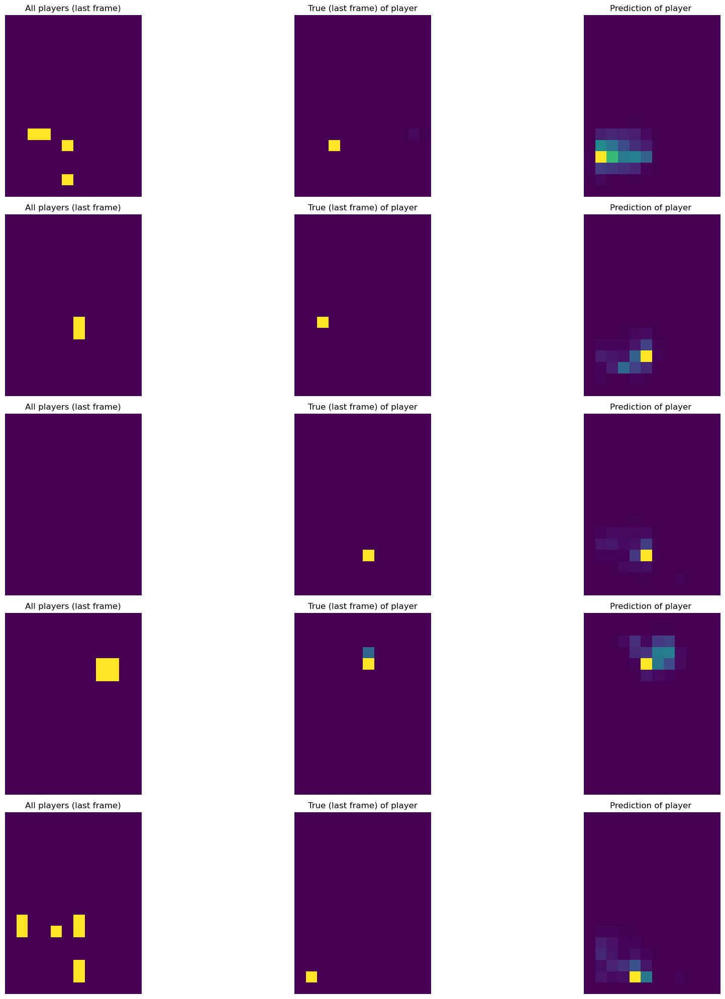

SCENE Scene2
TRAIN: [5033 4099 4068 ...  584 3268 3932]  TEST: [4672 4673 4674 4675 4676 4677 4678 4679 4680 4681 4682 4683 4684 4685
 4686 4687 4688 4689 4690 4691 4692 4693 4694 4695 4696 4697 4698 4699
 4700 4701 4702 4703 4704 4705 4706 4707 4708 4709 4710 4711 4712 4713
 4714 4715 4716 4717 4718 4719 4720 4721 4722 4723 4724 4725 4726 4727
 4728 4729 4730 4731 4732 4733 4734 4735 4736 4737 4738 4739 4740 4741
 4742 4743 4744 4745 4746 4747 4748 4749 4750 4751 4752 4753 4754 4755
 4756 4757 4758 4759 4760 4761 4762 4763 4764 4765 4766 4767 4768 4769
 4770 4771 4772 4773 4774 4775 4776 4777 4778 4779 4780 4781 4782 4783
 4784 4785 4786 4787 4788 4789 4790 4791 4792 4793 4794 4795 4796 4797
 4798 4799 4800 4801 4802 4803 4804 4805 4806 4807 4808 4809 4810 4811
 4812 4813 4814 4815 4816 4817 4818 4819 4820 4821 4822 4823 4824 4825
 4826 4827 4828 4829 4830 4831 4832 4833 4834 4835 4836 4837 4838 4839
 4840 4841 4842 4843 4844 4845 4846 4847 4848 4849 4850 4851 4852 4853
 4854 4855 485

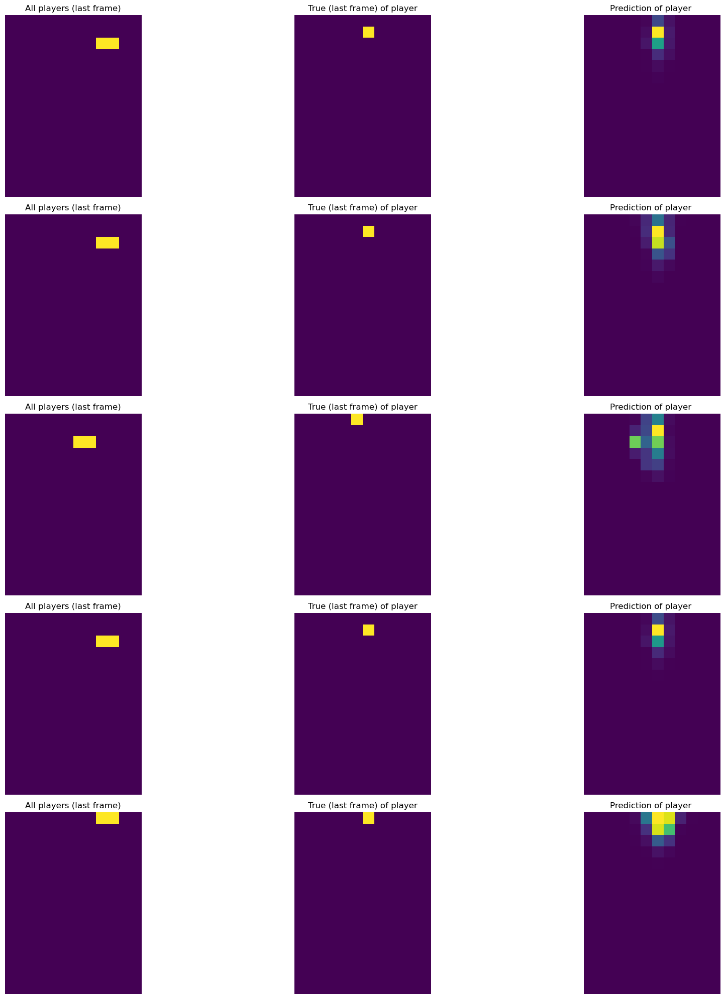

SCENE Scene3
TRAIN: [1924 5666 1686 ... 1761 1160 6281]  TEST: [   0    1    2 ... 5423 5424 5425]
Epoch 1/10
381/381 [==============================] - 389s 1s/step - loss: 0.0396 - mse: 0.0069 - mae: 0.0163 - val_loss: 0.0273 - val_mse: 0.0039 - val_mae: 0.0079
Epoch 2/10
381/381 [==============================] - 243s 637ms/step - loss: 0.0247 - mse: 0.0040 - mae: 0.0087 - val_loss: 0.0284 - val_mse: 0.0040 - val_mae: 0.0099
Epoch 3/10
381/381 [==============================] - 247s 647ms/step - loss: 0.0216 - mse: 0.0039 - mae: 0.0085 - val_loss: 0.0238 - val_mse: 0.0040 - val_mae: 0.0104
Epoch 4/10
381/381 [==============================] - 247s 648ms/step - loss: 0.0210 - mse: 0.0039 - mae: 0.0085 - val_loss: 0.0248 - val_mse: 0.0040 - val_mae: 0.0096
Epoch 5/10
381/381 [==============================] - 246s 645ms/step - loss: 0.0204 - mse: 0.0039 - mae: 0.0084 - val_loss: 0.0222 - val_mse: 0.0039 - val_mae: 0.0091
Epoch 6/10
381/381 [==============================] - 246s 647ms

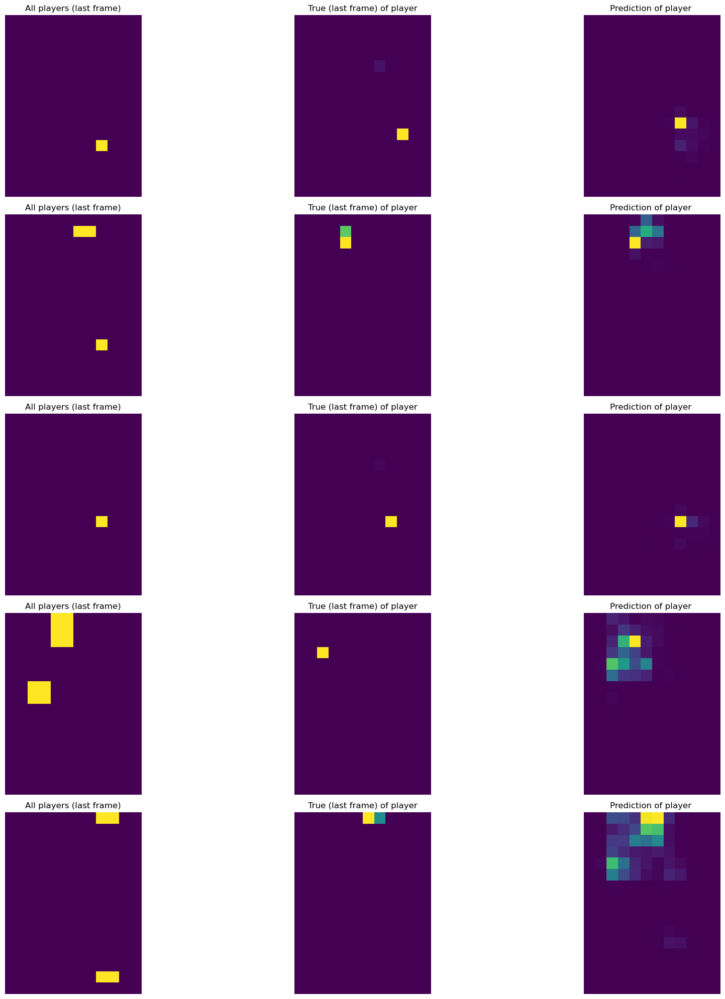

SCENE Scene4
TRAIN: [ 864 1012 1963 ... 4753 6639 3814]  TEST: [ 346  347  348 ... 5853 5854 5855]
Epoch 1/10
376/376 [==============================] - 499s 1s/step - loss: 0.0395 - mse: 0.0069 - mae: 0.0163 - val_loss: 0.0249 - val_mse: 0.0039 - val_mae: 0.0103
Epoch 2/10
376/376 [==============================] - 441s 1s/step - loss: 0.0253 - mse: 0.0040 - mae: 0.0088 - val_loss: 0.0240 - val_mse: 0.0039 - val_mae: 0.0091
Epoch 3/10
245/376 [==================>...........] - ETA: 2:23 - loss: 0.0220 - mse: 0.0039 - mae: 0.0086

In [ ]:
Y_pred_total=np.array([])

from sklearn.model_selection import KFold

print(np.unique(S))

for ixs,sc in enumerate(np.unique(S0)):
    print("SCENE",sc)
    #obtenemos train and test index basado en la escena ( y luego lo barajamos)
    train_indices=np.where(S0 != sc)[0]
    test_indices=np.where(S0 == sc)[0]

    np.random.shuffle(train_indices)

    #datos de train y test
    print("TRAIN:", train_indices, " TEST:", test_indices)
    
    XYT_train=XYT[train_indices]
    rssiT_train=rssiT[train_indices]
    YT_train=YT[train_indices]

    XYT_test=XYT[test_indices]
    rssiT_test=rssiT[test_indices]
    YT_test=YT[test_indices]
    
    autoencoder = load_model("autoencoder.model0.h5")
    
    history = autoencoder.fit([XYT_train,rssiT_train] , YT_train,
                    batch_size=16,
                        
            validation_data=([XYT_test,rssiT_test] , YT_test),
            epochs=10)
    
    YT_prediction=autoencoder.predict([XYT_test,rssiT_test])
    import matplotlib.pyplot as plt

    K=5
    ks=np.random.randint(0, len(test_indices), K)

    # Create a figure with two subplots (one row, two columns)
    fig, axes = plt.subplots(K, 3, figsize=(20, 20))

    for k in range(0,K):
        mpAll=XYT_test[ks[k]][T-1].reshape(N,M)

        axes[k,0].imshow(mpAll, cmap='viridis', interpolation='nearest')
        axes[k,0].set_title('All players (last frame)')
        axes[k,0].axis('off')

        label=rssiT_test[ks[k]][T-1]
        mpOne=YT_test[ks[k]].reshape(N,M)

        axes[k,1].imshow(mpOne, cmap='viridis', interpolation='nearest')
        axes[k,1].set_title('True (last frame) of player')
        axes[k,1].axis('off')


        mpPrediction=YT_prediction[ks[k]].reshape(N,M)

        axes[k,2].imshow(mpPrediction, cmap='viridis', interpolation='nearest')
        axes[k,2].set_title('Prediction of player ')
        axes[k,2].axis('off')


    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()


#print(np.bincount(YT_train))
#print(np.bincount(YT_test))



##### 